In [1]:
import os
import glob
import pandas as pd 
import xarray as xr 
import matplotlib.pyplot as plt 
import matplotlib.dates as mdates 
import numpy as np 
import scipy.stats as sc 
from scipy.stats import circmean, circstd
import matplotlib
plt.style.use("seaborn-v0_8-whitegrid")
plt.rcParams.update({'font.size':14})

llj_list = [6,11, 12, 13, 14, 15, 19, 21, 26]
no_llj_list=[1,2,3,5,7,8,10,16,17,18,20,22,23,24,25,27]


#data
#open dataset of all flights 
def open_all_beluga_TMP_flights(): 
    working_path=os.getcwd()+"/" 
    data_path = working_path+"/../data//Dorff-etal_2026_VRS_meteo_allfiles//"
    fname="BELUGA_VRS_L2_TMP_met_"+"*.nc"
    all_files_list=glob.glob(data_path+fname)
    ds_all=xr.open_mfdataset(all_files_list,concat_dim="time",combine="nested")
    return ds_all
   
#open dataset of specific flight
def open_beluga_TMP_flight(flight="RF01"): 
    working_path=os.getcwd()+"/"
    data_path = working_path+"/../data//Dorff-etal_2026_VRS_meteo_allfiles//"
    fname="BELUGA_VRS_L2_TMP_met_"+flight+"*"
    file_list=glob.glob(data_path+fname)
    file_to_read=file_list[0]
    ds=xr.open_dataset(file_to_read)
    return ds

#open dataset of mean profile 

def open_mean_profile (flight=''):
    data = r'C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\data\mean_profiles\mean_v_flight_'+flight+'.csv'
    ds = pd.read_csv(data, index_col=0)
    return ds

def open_radiosonde_data(flight=''):
    ds = open_beluga_TMP_flight(flight=flight)
    date = date=ds.attrs['flight_date']
    working_path = os.getcwd()
    data_path = working_path + '/../data/Dorff-etal_2026_VRS_radio_allfiles/'
    fname = data_path + 'Radiosonde_VRS_L2_'+date[0:8]+'.nc'
    ds = xr.open_dataset(fname)
    return ds 

def open_all_radiosonde(): 
    working_path=os.getcwd()+"/" 
    data_path = working_path+"/../data//Dorff-etal_2026_VRS_radio_allfiles//"
    fname='Radiosonde_VRS_L2_'+'*.nc'
    all_files_list=glob.glob(data_path+fname)
    ds_all=xr.open_mfdataset(all_files_list,concat_dim="time",combine="nested")
    return ds_all

path_carra = r"C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\data\STN_CARRA_height_levels_20240324_20240410.nc"
ds_carra = xr.open_dataset(path_carra)
ds_carra = ds_carra.sortby('valid_time')
    

#open_radiosonde_data(flight='RF01')
#open_mean_profile(flight='RF12')
#open_radiosonde_data(flight='RF12')
#open_beluga_TMP_flight(flight='RF12')
#open_all_radiosonde()
ds_carra

<xarray.Dataset> Size: 109kB
Dimensions:            (valid_time: 432, heightAboveGround: 11)
Coordinates:
  * valid_time         (valid_time) datetime64[ns] 3kB 2024-03-24 ... 2024-04...
    expver             (valid_time) <U4 7kB ...
  * heightAboveGround  (heightAboveGround) float64 88B 15.0 30.0 ... 400.0 500.0
    latitude           float64 8B ...
    longitude          float64 8B ...
Data variables:
    pres               (valid_time, heightAboveGround) float32 19kB ...
    r                  (valid_time, heightAboveGround) float32 19kB ...
    t                  (valid_time, heightAboveGround) float32 19kB ...
    wdir               (valid_time, heightAboveGround) float32 19kB ...
    ws                 (valid_time, heightAboveGround) float32 19kB ...
    reanalysis_flag    (valid_time) float64 3kB ...
Attributes:
    GRIB_centre:             enmi
    GRIB_centreDescription:  Oslo
    GRIB_subCentre:          255
    Conventions:             CF-1.7
    institution:             Oslo
    history:                 2025-04-03T15:28 GRIB to CDM+CF via cfgrib-0.9.1...

In [2]:
#mean wind profile 
def mean_profile(flight='', dz=1, window=20): #5m zu wenig 
    
    ds = open_beluga_TMP_flight(flight=flight)
    z_max = int(ds['z_b'].max())
    vmean_list=[]
    z_list=[]
    std_list=[]


    for z in range(0,z_max,dz): #calculate running mean every meter 
        
        #window for mean calculation
        zmax_window=z+window/2 
        zmin_window=z-window/2
        
        #slicing dataset
        ds_masked_u = ds['vv'].where(ds['z_b'] > zmin_window, drop=True)
        ds_masked_u2 = ds_masked_u.where(ds['z_b'] < zmax_window, drop=True).dropna(dim='time')

        #calculate mean and std 
        v_mean = float(ds_masked_u2.mean()) 
        v_std = float(ds_masked_u2.std())

        if not np.isnan(v_mean): #filter NaN values 
            vmean_list.append(v_mean)
            z_list.append(z)
            std_list.append(v_std)
        
        
    return vmean_list, z_list, std_list


#save every mean wind profile into csv 
def save_mean_profiles():
    
    for n in range(1,28):
        if n ==9 or n ==4:
            print('no data available')
        else:
            v, z , std= mean_profile(flight=f'RF{n:02d}')
            mean_wind=pd.DataFrame({'v':v, 'std':std}, index=z)
            os.makedirs(os.getcwd() + '/../data/mean_profiles', exist_ok=True)
            path = os.getcwd()+'/../data/mean_profiles'
            filepath = path + f'/mean_v_flight_RF{n:02d}.csv'
            mean_wind.to_csv(filepath)
            print('file saved:'+filepath)

#a, b, c = mean_profile(flight='RF07', dz=5, window=10)
#save_mean_profiles()
def open_mean_profile(flight='RF'):
    path=r'C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\data\mean_profiles\mean_v_flight_'+flight+'.csv'
    return pd.read_csv(path)


<>:51: SyntaxWarning: invalid escape sequence '\m'
<>:51: SyntaxWarning: invalid escape sequence '\m'
C:\Users\mauri\AppData\Local\Temp\ipykernel_12276\3326521836.py:51: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_xlabel('Horizontale Windgeschwindigkeit ($\mathrm{{m\,s}^{-1}}$)')


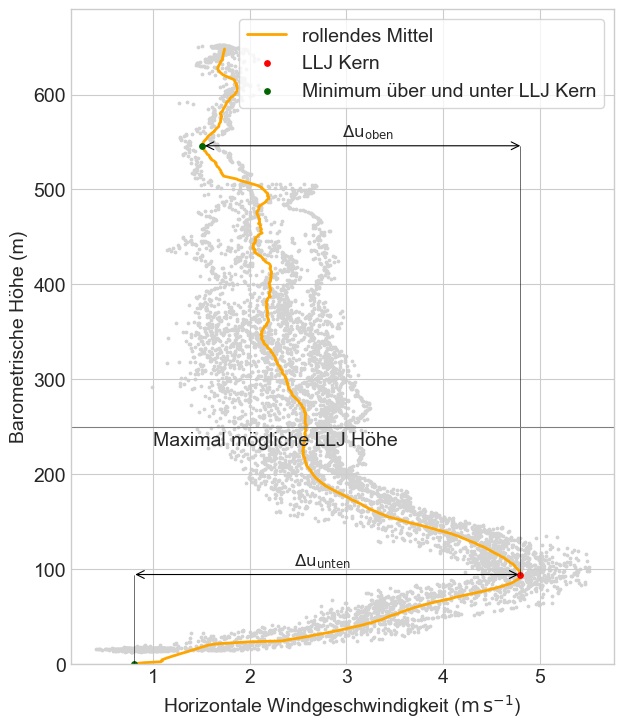

In [36]:
#LLJ detection algorithm
#criteria from Egerer at al. 2023:

#umax under 250m 
#umax(llj) - umin(boden) & umin(hoch) >=2,5m/s 


def llj_detection(flight=""):
    #exclude flight 04 and 09 (no data)
    if flight =='RF04' or flight == 'RF09':
        return print ('no data available')
    else: 
        #open profile 
        ds = open_mean_profile(flight=flight)
        #calculate vmax and z(vmax) 
        
        v_max = ds['v'].max()   
        v_max_pos=ds['v'].argmax()
        z_v_max = ds['v'].idxmax()

    #detection of LLJ
        if z_v_max <= 250: 
            v_min_oben = ds['v'].iloc[v_max_pos:].min()
            deltav_oben = v_max-v_min_oben

            if deltav_oben >= 2.5:
                v_min_unten = ds['v'].iloc[:v_max_pos].min()
                deltav_unten = v_max-v_min_unten
                if deltav_unten >= 2.5:
                    return print('flight' + flight + ': LLJ existing')
                else: 
                    return print('flight' + flight + ': no LLJ detected')

            else: 
                return print('flight' + flight + ': no LLJ detected')
        else: 
            return print('flight' + flight + ': no LLJ detected')

#loop over all flights
def llj_detect_all():
    for n in range (1,28): 
        llj_detection(flight=f'RF{n:02d}')
#llj_detect_all()

#illustration figure 
ds = open_mean_profile(flight='RF12')
ds_raw = open_beluga_TMP_flight(flight='RF12')
fig = plt.figure(figsize=(7,8.5))
ax1 = fig.add_subplot(1,1,1)
ax1.plot(ds['v'], ds.index, label='rollendes Mittel', zorder=1, lw=2, color='orange')
ax1.set_xlabel('Horizontale Windgeschwindigkeit ($\mathrm{{m\,s}^{-1}}$)')
ax1.set_ylabel('Barometrische Höhe (m)')
ax1.scatter(ds_raw['vv'], ds_raw['z_b'],  color='lightgrey', zorder=0, s=3)
ax1.set_ylim(0,690)

#z and v from llj-core
v_max = ds['v'].max()  
v_max_pos=ds['v'].argmax()
z_v_max = ds['v'].idxmax()

#z and v min above llj
z_vmin_oben = ds['v'].iloc[v_max_pos:].idxmin()
v_min_oben = ds['v'].iloc[v_max_pos:].min()

#and vmin below llj
v_min_unten = ds['v'].iloc[:v_max_pos].min()
z_vmin_unten=ds['v'].iloc[:v_max_pos].idxmin()

#markers
ax1.scatter(v_max, z_v_max, color='red', s=15, label='LLJ Kern', zorder=1)
ax1.scatter([v_min_oben, v_min_unten], [z_vmin_oben, z_vmin_unten], color='darkgreen', s=15, zorder=1, label='Minimum über und unter LLJ Kern')

#vertical lines 
ax1.plot([v_min_unten,v_min_unten],[z_v_max, z_vmin_unten], color='black', lw=0.4)
ax1.plot([v_max, v_max],[z_vmin_oben, z_v_max], color='black', lw=0.4)
#hline als marker nicht als linie 
ax1.axhline(y=250, lw=0.8, color='grey')

#arrows
ax1.annotate(r'',xy=(v_min_unten-0.02, z_v_max),xytext=(v_max+0.01, z_v_max), arrowprops=dict(arrowstyle='<->', color='black', lw=0.8))
ax1.annotate(r'',xy=(v_min_oben, z_vmin_oben),xytext=(v_max+0.028, z_vmin_oben), arrowprops=dict(arrowstyle='<->', color='black', lw=0.8))

#text
ax1.text(x=(v_max+v_min_oben)/2-0.2, y=z_vmin_oben+10,s=r'$\mathrm{\Delta u_{oben}}$', fontsize=12)
ax1.text(x=(v_max+v_min_unten)/2-0.35, y=z_v_max+10, s=r'$\mathrm{\Delta u_{unten}}$', fontsize=12)
ax1.text(x=1, y=250-20, s='Maximal mögliche LLJ Höhe')
ax1.legend(loc='upper right', frameon=True)

# df, a, b = flight_segment_analysis(flight='RF12' )
# ax1.scatter(df['v_max'], df['z_max'], color='black', s=3.5)

plt.savefig(r"C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\llj_algo_illustration", bbox_inches='tight')
#print('figure saved')

In [4]:
#detect LLJ in every Profile of a flight 

def llj_detect_segment(ds, deltamin=2.5 , zmax=250): 
    #calculate height and strength of LLJ
    v_max=ds['vv'].max().item()
    t_vmax = ds['vv'].idxmax(dim='time')
    if np.isnat(t_vmax):
        return None
    z_max = ds['z_b'].sel(time=t_vmax).item()
    if z_max <=zmax: 
        ds_oben = ds.where(ds['z_b']>=z_max, drop=True)
        if ds_oben['vv'].size==0: 
            return None
        min_oben = ds_oben['vv'].min().item()
        delta_oben = v_max - min_oben
        
        if delta_oben >= 2.5:
            ds_unten = ds.where(ds['z_b']<=z_max, drop=True)
            if ds_unten['vv'].size == 0: 
                return None
            min_unten = ds_unten['vv'].min().item()
            delta_unten=v_max-min_unten
            
            if delta_unten >= deltamin:
                if delta_unten > delta_oben:
                    llj_strength = delta_unten
                else:
                    llj_strength = delta_oben

                return z_max, v_max, t_vmax, llj_strength 
            else:
                return None

        else:
            return None
    else:
        return None


def flight_segment_analysis(flight="", adjusted=True): #gives back list with LLJ height and strength 
    ds = open_beluga_TMP_flight(flight=flight)
    segments = np.unique(ds['flight_segments'].values) #create array with segment numbers 
    results = []
    #loop over every segment 
    for seg in segments:  
        if abs(seg) < 100: #only use descent or ascent profiles 
            continue
        ds_seg = ds.where(ds['flight_segments']==seg, drop=True)
        if ds_seg['vv'].size==0:
            continue

        if adjusted:
            if flight=='RF06':
                out = llj_detect_segment(ds_seg, deltamin=1.5)
            elif flight=='RF11':
                out = llj_detect_segment(ds_seg, zmax=400)
            elif flight=='RF21':
                out = llj_detect_segment(ds_seg, deltamin=2)
            else:
                out = llj_detect_segment(ds_seg)
        else:
            out=llj_detect_segment(ds_seg)
            

        
        if out is not None:    #write output values into list, turn time into datetime (consistent indexing for plotting) 
            z_max, v_max, t_vmax, llj_strength = out 

            results.append( 
                {'segment': float(seg), 'v_max': v_max,'z_max': z_max, 'time':pd.to_datetime(t_vmax.values), 'llj_strength': llj_strength,
                 })

    df = pd.DataFrame(results)
    if not df.empty:
        delta_v_llj=df['v_max'].max()-df['v_max'].min() 
        delta_z_llj=df['z_max'].max()-df['z_max'].min()
    else:
        delta_v_llj=0
        delta_z_llj=0


    return df, delta_v_llj, delta_z_llj

flight_segment_analysis(flight='RF11')





(   segment  v_max       z_max                time  llj_strength
 0   -113.0   7.38  382.661798 2024-03-30 13:33:31          6.43
 1   -111.0   7.39  325.070931 2024-03-30 12:48:46          7.00
 2   -109.0   7.26  307.042149 2024-03-30 12:28:22          6.23
 3   -107.0   7.56  323.042200 2024-03-30 12:05:35          6.65
 4    110.0   5.74  334.814763 2024-03-30 12:40:37          5.15,
 1.8199999999999994,
 75.61964911643469)

In [5]:
#calc mean wind profiles for llj segments 

def mean_ws_llj(flight=''):
    ds = open_beluga_TMP_flight(flight=flight)

    df, deltav, deltaz = flight_segment_analysis(flight=flight)
    valid_segs = np.array(df['segment'])

    profile = []
    for seg, ds_seg in ds.groupby('flight_segments'):
        if not seg in valid_segs:
            continue 

        mask = np.isfinite(ds_seg['vv']) & np.isfinite(ds_seg['z_b'])#only use valid values 
        z = ds_seg['z_b'].values[mask]
        vv = ds_seg['vv'].values[mask]

        df_a = pd.DataFrame(
        {'segment': seg, 'z': z, 'vv': vv}
        )
        profile.append(df_a)

    #add to one dataframe
    df_segs = pd.concat(profile, ignore_index=True)

    #create bins
    dz = 1 #every m 1 value because of different profile quantity per flight --> running mean must be over a normalized variable 
    z_grid = np.arange(df_segs['z'].min(), df_segs['z'].max() + dz, dz) 
    df_segs['z_bin'] = pd.cut(df_segs['z'], bins=z_grid, labels=z_grid[:-1]) 

    #mean for every bin 
    seg_mean = (df_segs.groupby('z_bin', observed=True)['vv'].agg(['mean', 'std']).reset_index())
    seg_mean['vv'] = seg_mean['mean']
    seg_mean['vv_std'] = seg_mean['std']
    
    seg_mean['z']=seg_mean['z_bin'].astype(float)+dz/2
    window = 10
    #calc running mean 
    seg_mean['vv_rmean'] = (seg_mean['vv'].rolling(window=window, center=True).mean())
    seg_mean = seg_mean[seg_mean['z']<=600]
    if flight=='RF21':
        idx_llj = np.argmax(seg_mean['vv_rmean'].iloc[0:400])
        llj_height = seg_mean['z'].iloc[idx_llj] 
    else:
        idx_llj = np.argmax(seg_mean['vv_rmean'])
        llj_height = seg_mean['z'].iloc[idx_llj] 




    return seg_mean, llj_height
    


In [6]:
#llj_calc_shear 
def calc_shear_segment(ds, seg):

    
    dz = 5   
    ds_seg = ds.where(ds['flight_segments']==seg).dropna(dim='time', subset=['z_b', 'vv'])
    shear_list = []

    #in irgendeinem segment von Flug 11 gibt es keine gültigen Daten
    if ds_seg.sizes.get('time', 0) == 0:
        return None
    if ds_seg['z_b'].notnull().sum().values == 0:
        return None

    z = np.arange(ds_seg['z_b'].min().values, ds_seg['z_b'].max().values+dz, dz)


    for z in z: #calc shear for every bin (2m bin)
        zmax = z+dz/2
        zmin = z-dz/2

        v_zmin_idx = np.abs(ds_seg['z_b']-zmin).argmin()
        v_zmax_idx = np.abs(ds_seg['z_b']-zmax).argmin() 

        zmin = ds_seg['z_b'].isel(time=v_zmin_idx).values
        zmax = ds_seg['z_b'].isel(time=v_zmax_idx).values
        dz_v = zmax-zmin

        v_zmin = ds_seg['vv'].isel(time=v_zmin_idx).values
        v_zmax = ds_seg['vv'].isel(time=v_zmax_idx).values
        du = v_zmax-v_zmin

        dudz = du/dz_v
        time = ds_seg.where(ds_seg['z_b']==z).time
        shear_list.append(
            {'dudz': dudz, 'time':time, 'z':z }
        )
    
    df = pd.DataFrame(shear_list)
    return df  





In [7]:
def plot_mean_shear_profiles(flight):  

    df, a, b = flight_segment_analysis(flight=flight)
    
    ds = open_beluga_TMP_flight(flight=flight)
    list_all = []
    ds_mean, a = mean_ws_llj(flight=flight)
    v_mean = ds_mean['vv_rmean']
    z= ds_mean['z']
    vmax_index = v_mean.idxmax()
    llj_height=z.loc[vmax_index]
    std = ds_mean['vv_std']
    
    if not df.empty:
        for seg in df['segment']:
            df_shear = calc_shear_segment(ds=ds, seg=seg)
            list_all.append(df_shear)

        df_all = pd.concat(list_all)
        df_all = df_all.dropna()
        dz = 5
        
        bins = np.arange(df_all['z'].min(), df_all['z'].max()+dz, dz)
        df_all['zbin']=pd.cut(df_all['z'], bins=bins)
        df_grouped_mean = (df_all.groupby('zbin')['dudz'].agg(['mean', 'std']).reset_index())
        df_grouped_mean['dudz'] = df_grouped_mean['mean']
        df_grouped_mean['std_dudz'] = df_grouped_mean['std']
        df_grouped_mean['rolling_dudz'] = df_grouped_mean['dudz'].rolling(window=5, center=True).mean()#rolling mean over 5 2m dudz bins (-->10m)
        #df_grouped_mean['std_dudz'] = df_grouped_mean['dudz'].rolling(window=5).std()
        df_grouped_mean['z']=df_grouped_mean['zbin'].apply(lambda x: x.mid).astype(float)
        
        #plot dudz with mean wind llj profile 
        fig, ax1 = plt.subplots(1,1, figsize=(8,8), constrained_layout=True)
        ax2 = ax1.twiny()
        ax1.plot(v_mean, z/llj_height, label='mean horizontale Windgschwindigkeit', color='orange') #20m running mean 
        ax1.fill_betweenx(z/llj_height, v_mean+std, v_mean-std, color='orange', alpha=0.3)
        ax1.set_xlabel('Horizontlale Windgeschwindigkeit $\mathrm{m\,s^{-1}}$')
        ax1.set_xlim(0,10)
        
        ax2.plot(df_grouped_mean['rolling_dudz'], df_grouped_mean['z']/llj_height, label='vertikale Windscherung')#10m running mean
        ax2.fill_betweenx(df_grouped_mean['z']/llj_height,df_grouped_mean['rolling_dudz']+df_grouped_mean['std_dudz'], df_grouped_mean['rolling_dudz']-df_grouped_mean['std_dudz'], alpha=0.3 )
        ax2.set_xlabel('mean vertikale Windscherung ($\mathrm{s^{-1}}$)')
        ax1.set_ylabel('Normalisierte, barometrische Höhe$~(\mathrm{z/z_{LLJ}})$')
        ax2.set_ylim(0,4)
        ax2.set_xlim(-0.1,0.1)
        ax2.vlines(0, 0, 800, linestyles='dotted', color='black', linewidth=0.7)      
        ax2.grid(False)
        fig.legend(loc='upper right', bbox_to_anchor=(0.98, 0.94), frameon=True, edgecolor='lightgrey')
        #fig.savefig(r'C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\shear\'shear_flight_'+ flight +'.png', bbox_inches='tight')
        #plt.close()

# for n in llj_list:
#     plot_mean_shear_profiles(flight='RF'+f'{n:02d}')
#     print(str(n) + 'done!')

#plot_mean_shear_profiles(flight='RF21')


<>:37: SyntaxWarning: invalid escape sequence '\m'
<>:42: SyntaxWarning: invalid escape sequence '\m'
<>:43: SyntaxWarning: invalid escape sequence '\m'
<>:37: SyntaxWarning: invalid escape sequence '\m'
<>:42: SyntaxWarning: invalid escape sequence '\m'
<>:43: SyntaxWarning: invalid escape sequence '\m'
C:\Users\mauri\AppData\Local\Temp\ipykernel_12276\3739366641.py:37: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_xlabel('Horizontlale Windgeschwindigkeit $\mathrm{m\,s^{-1}}$')
C:\Users\mauri\AppData\Local\Temp\ipykernel_12276\3739366641.py:42: SyntaxWarning: invalid escape sequence '\m'
  ax2.set_xlabel('mean vertikale Windscherung ($\mathrm{s^{-1}}$)')
C:\Users\mauri\AppData\Local\Temp\ipykernel_12276\3739366641.py:43: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_ylabel('Normalisierte, barometrische Höhe$~(\mathrm{z/z_{LLJ}})$')


c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. T

RF06 done!


c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. T

RF11 done!


c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. T

RF12 done!


c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. T

RF13 done!


c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. T

RF14 done!


c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. T

RF15 done!


c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. T

RF19 done!


c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. T

RF21 done!


c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. To get a single, flat index, please use np.argmin(da.data) or np.argmax(da.data) instead of da.argmin() or da.argmax().
  result = self.variable.argmin(dim, axis, keep_attrs, skipna)
c:\Users\mauri\miniconda3\Lib\site-packages\xarray\core\dataarray.py:6318: FutureWarning: Behaviour of argmin/argmax with neither dim nor axis argument will change to return a dict of indices of each dimension. T

RF26 done!


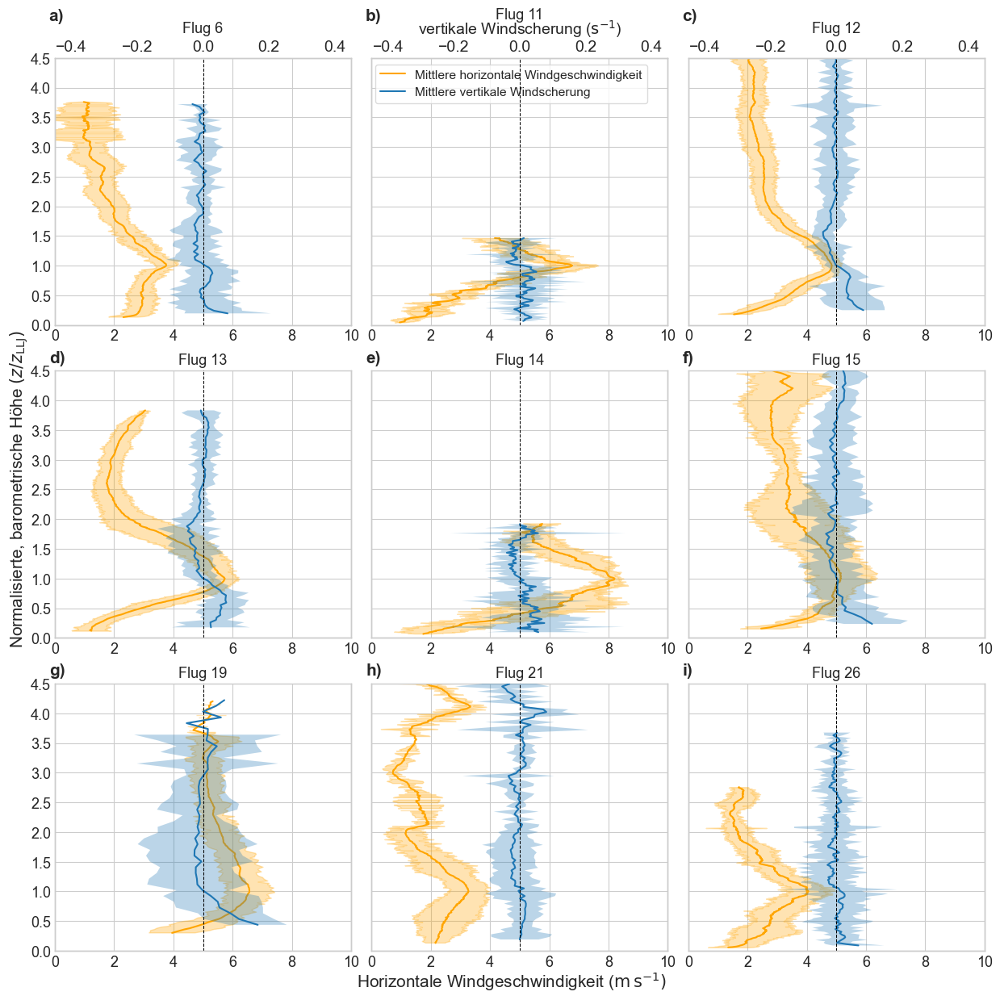

In [ ]:
def plot_mean_shear_profiles(flight, ax1):

    df, a, b = flight_segment_analysis(flight=flight)

    ds = open_beluga_TMP_flight(flight=flight)
    list_all = []

    ds_mean, a = mean_ws_llj(flight=flight)
    v_mean = ds_mean['vv_rmean']
    z = ds_mean['z']
    if flight =='RF21':

        vmax_index = v_mean.loc[0:400].idxmax()
        llj_height = z.loc[vmax_index]
    else:
        vmax_index = v_mean.idxmax()
        llj_height = z.loc[vmax_index]
        
    std = ds_mean['vv_std']

    if not df.empty:
        for seg in df['segment']:

            df_shear = calc_shear_segment(ds=ds, seg=seg)

            if df_shear is not None:
                list_all.append(df_shear)

        if not list_all:
            return None

        df_all = pd.concat(list_all)
        df_all = df_all.dropna()

        dz = 5
        bins = np.arange(df_all['z'].min(),df_all['z'].max() + dz,dz)
        df_all['zbin'] = pd.cut(df_all['z'],bins=bins)

        df_grouped_mean = (df_all.groupby('zbin')['dudz'].agg(['mean', 'std']).reset_index())
        df_grouped_mean['dudz'] = df_grouped_mean['mean']
        df_grouped_mean['std_dudz'] = df_grouped_mean['std']
        df_grouped_mean['rolling_dudz'] = df_grouped_mean['dudz'].rolling(window=4, center=True).mean()#rolling mean over 5 2m dudz bins (-->10m)
        df_grouped_mean['z'] = (df_grouped_mean['zbin'].apply(lambda x: x.mid).astype(float))

        ax1.plot(v_mean,z / llj_height,label='Mittlere horizontale Windgeschwindigkeit',color='orange')
        ax1.fill_betweenx(z / llj_height,v_mean + std,v_mean - std,color='orange',alpha=0.3)
        ax2 = ax1.twiny()
        ax2.plot(df_grouped_mean['rolling_dudz'],df_grouped_mean['z'] / llj_height,label='Mittlere vertikale Windscherung')
        ax2.fill_betweenx(df_grouped_mean['z'] / llj_height,df_grouped_mean['rolling_dudz'] + df_grouped_mean['std_dudz'],df_grouped_mean['rolling_dudz'] - df_grouped_mean['std_dudz'],alpha=0.3)
        ax2.vlines(0,0,800,linestyle='--',color='black', linewidth=0.75)
        ax2.grid(False)
        ax1.set_xlim(0, 10)
        ax2.set_xlim(-0.45, 0.45)
        ax1.set_ylim(0, 4.5)
        ax2.set_ylim(0, 4.5)
        ax1.set_title(flight)
        return ax1, ax2

    
fig, axes = plt.subplots(3, 3,figsize=(12, 12),constrained_layout=True)
axes = axes.flatten()

ax2_list = []
yax_num=[0,3,6]
xax_num=[6,7,8]

for i, (ax, n) in enumerate(zip(axes, llj_list)):
    flight = f'Flug {n}'
    result = plot_mean_shear_profiles(
        flight=f'RF{n:02d}', ax1=ax)
    if result is not None:
        ax1, ax2 = result
        ax2_list.append(ax2)
    
    ax.set_title(flight, fontsize=13)
    print(f'RF{n:02d} done!')
    if i <3:
        ax2.tick_params(axis='x',top=True,labeltop=True)
        ax2.spines['top'].set_visible(True)
    else:
        ax2.tick_params(axis='x', top=False, labeltop=False) 
        ax2.spines['top'].set_visible(False)

    if i in yax_num:
        ax1.tick_params(axis='y',left=True,labelleft=True)
    else:
        ax1.tick_params(axis='y',left=False,labelleft=False)
        ax2.tick_params(axis='y',left=False,right=False,labelleft=False,labelright=False)
        
    if i in xax_num:
        ax1.tick_params(axis='x',bottom=True,labelbottom=True)
    else:
        ax1.tick_params(axis='x',left=False,labelleft=False)

fig.supxlabel(r'Horizontale Windgeschwindigkeit ($\mathrm{m\,s^{-1}})$',y=-0.02,fontsize=15)
fig.supylabel(r'Normalisierte, barometrische Höhe $(z/z_{\mathrm{LLJ}})$',x=-0.02,fontsize=15)

handles1, labels1 = axes[1].get_legend_handles_labels()
handles2, labels2 = ax2_list[1].get_legend_handles_labels()

axes[1].legend(handles1 + handles2,labels1 + labels2,loc='upper left',bbox_to_anchor=(-0.01, 1),fontsize=11.2,frameon=True, edgecolor='lightgrey')

for ax in axes:
    ax.tick_params(axis='both', labelsize=13)

letters = list('abcdefghi')

for i, (ax, letter) in enumerate(zip(axes, letters)):
    if i < 3:
        y_pos = 1.13
    else:
        y_pos = 1.02
        ax.text(-0.02, y_pos, f'{letter})',  transform=ax.transAxes, ha='left', va='bottom', fontsize=15, fontweight='bold')
    
    if i == 1:
        ax.text(0.5, 1.07, r'vertikale Windscherung ($\mathrm{s^{-1}}$)', transform=ax.transAxes, ha='center',  va='bottom', fontsize=14)
        ax.set_title('Flug 11', fontsize=13, pad=35)
        
    
    
#plt.savefig(r'C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\shear\merged_shear.png', bbox_inches='tight')
plt.show()



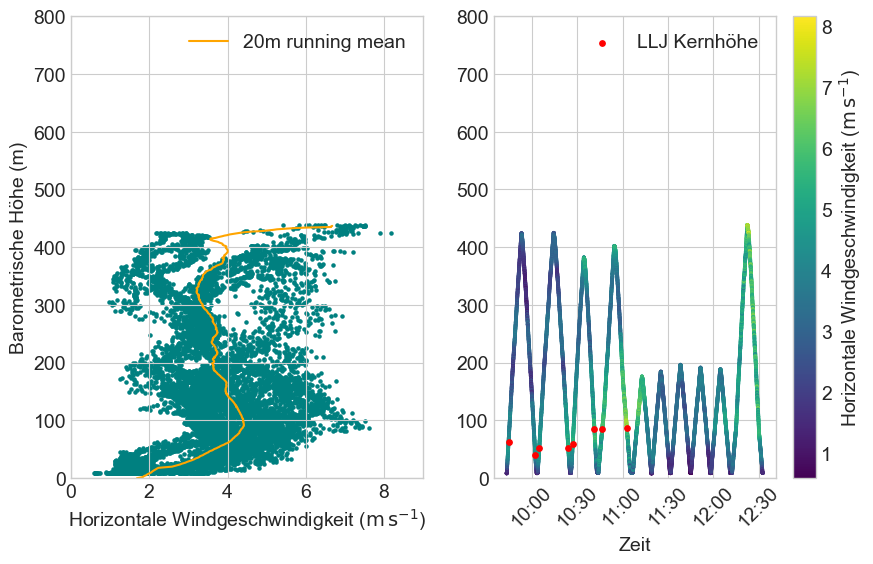

In [9]:
#quicklook flight (plot)
def quicklook_ws_rf(flight="RF01"):
    # read file
    if not flight=="all":
        ds=open_beluga_TMP_flight(flight=flight)
    else:
        ds=open_all_beluga_TMP_flights()
    ws=ds["vv"]
    z=ds["z_b"]
    # plot file
    quicklook_fig=plt.figure(figsize=(9,9))
    ax1=quicklook_fig.add_subplot(111)
    ax1.scatter(ws, z, marker="o",s=5,color="teal")
    ax1.set_xlabel(r"Horizontale Windgeschwindigkeit ($\mathrm{m\,s}^{-1}$)")
    ax1.set_ylabel("Barometrische Höhe (m)")
    ax1.set_title(flight)

#contourplot 
def scatterplot_ws_time(flight="RF01"):
#read file 
    if not flight=="all":
        ds=open_beluga_TMP_flight(flight=flight)
    else:
        ds=open_all_beluga_TMP_flights()
    ws=ds["vv"]
    z=ds["z_b"]
    #plot file 
    fig_series=plt.figure(figsize=(16,9))
    ax1=fig_series.add_subplot(111)
    s1=ax1.scatter(ds.time,z,c=ws,cmap="viridis",marker="o",s=5)
    c1=plt.colorbar(s1)
    c1.set_label(r"Horizontale Windgeschwindigkeit ($\mathrm{m\,s}^{-1}$)")
    ax1.set_xlabel("Zeit")
    ax1.set_ylabel("Barometrische Höhe (m)")
    ax1.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))
    
#scatter and contour combined 
def plotfeld_tpm_flight(flight=''):
    
    #read files
    ds = open_beluga_TMP_flight(flight)
    ws = ds['vv'].values
    z = ds['z_b'].values
    date=ds.attrs['flight_date']
    ds_mean = open_mean_profile(flight=flight)
    #ds_rs = radiosonde_mean_dir(flight=flight)
    

    #create figure
    fig = plt.figure(figsize=(10,6))
    #fig.suptitle(flight + ': ' + date[0:4] +'-'+ date[4:6]+'-'+ date[6:8])

    #scatter
    ax1=fig.add_subplot(121)
    ax1.scatter(ws, z, marker="o",s=5,color="teal", zorder=0)
    ax1.set_xlabel(r"Horizontale Windgeschwindigkeit ($\mathrm{m\,s}^{-1}$)")
    ax1.set_ylabel("Barometrische Höhe (m)")
    ax1.set_ylim(0,800)
    ax1.set_xlim(0,9)

    #mean profile
    ax1.plot(ds_mean['v'], ds_mean.index, label='20m running mean', color='orange', zorder=1)

    
    #contour    
    ax2=fig.add_subplot(122)
    s1=ax2.scatter(ds.time,z,c=ws,cmap="viridis",marker="o",s=3)
    c1=plt.colorbar(s1)
    c1.set_label(r"Horizontale Windgeschwindigkeit ($\mathrm{m\,s}^{-1}$)")
    ax2.set_xlabel("Zeit")
    #ax2.set_ylabel("Barometrische Höhe (m)")
    ax2.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))

    #add radiosonde data 
    #ax1.scatter(ds_rs['u_mean_rolling'], ds_rs['altitude'], color='black', s=8, zorder=2, label='Radiosondendaten')
    ax1.legend()


    #LLJ im Kontur (profilen) mit Zeitindex markieren
    ds_llj, deltav, deltaz = flight_segment_analysis(flight=flight)
    if not ds_llj.empty:
        ax2.scatter(ds_llj['time'],ds_llj['z_max'], color='red',s=15,label='LLJ Kernhöhe')
        ax2.legend()
    ax2.set_ylim(0,800)
    ax2.tick_params(axis='x', labelrotation=45)
    #save figure 
    fig_name = flight + '_' + date[0:4] +'-'+ date[4:6]+'-'+ date[6:8]
    os.makedirs(os.getcwd()+ '/plots/flights/', exist_ok=True)
    plot_path = os.getcwd() +'/plots/flights/'
    #fig.savefig(plot_path + fig_name+'.png', bbox_inches='tight')
    #print('figure saved as:'+ plot_path+fig_name)
   
    



#loop over all flights 
def plot_all_flights():
    for n in range(1,28):
        if n == 9 or n == 4:
            print('no data available')
        else:
            plotfeld_tpm_flight(flight=f'RF{n:02d}')

#plot_all_flights()
plotfeld_tpm_flight(flight='RF15')


<>:59: SyntaxWarning: invalid escape sequence '\,'
<>:59: SyntaxWarning: invalid escape sequence '\,'
C:\Users\mauri\AppData\Local\Temp\ipykernel_12276\1466724150.py:59: SyntaxWarning: invalid escape sequence '\,'
  label="rollendes Mittel (20$\,$m)",


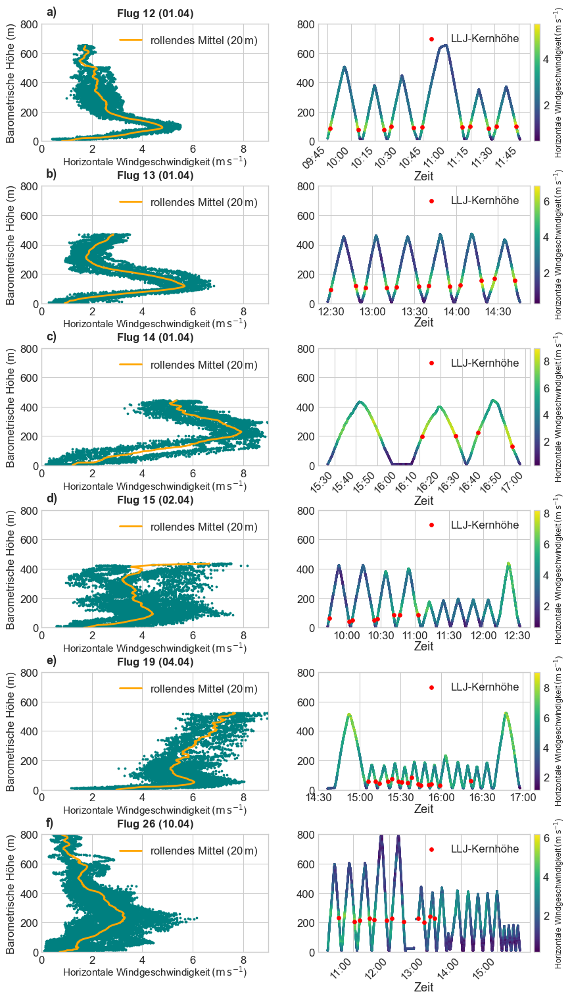

In [ ]:
def plotfeld_tpm_flights(flights):

    n_flights = len(flights)
    fig, axes = plt.subplots(nrows=n_flights, ncols=2, figsize=(9, 15), squeeze=False)
    for i, flight in enumerate(flights):

        ax1 = axes[i, 0]
        ax2 = axes[i, 1]

        ax1.text(0.02, 1.05, f"{chr(97 + i)})", transform=ax1.transAxes, fontsize=13, fontweight="bold", ha="left", va="bottom")

        ds = open_beluga_TMP_flight(flight)
        date=ds.attrs['flight_date']
        date_formatted = f"{date[6:8]}.{date[4:6]}"

        ws = ds['vv'].values
        z = ds['z_b'].values

        ds_mean = open_mean_profile(flight=flight)

        ax2.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))

        if i == 0 or i == 2 or i==5:
            plt.setp(ax2.get_xticklabels(), rotation=45, ha="right" )
        ax1.scatter(ws, z, marker="o", s=3, color="teal", zorder=1)

        ax1.plot(ds_mean['v'], ds_mean.index, color="orange", linewidth=2, label="rollendes Mittel (20$\,$m)", zorder=2)
        ax1.set_xlabel(r'Horizontale Windgeschwindigkeit$\,(\mathrm{m\,s^{-1}}$)', fontsize=11, labelpad=0.001)
        ax1.set_ylabel("Barometrische Höhe (m)", fontsize=12)
        ax1.set_ylim(0, 800)
        ax1.set_xlim(0, 9)
        ax1.tick_params(axis="both", labelsize=12)
        ax1.legend(fontsize=12, loc="upper right")

        ax1.set_title('Flug '+ flight[-2:] + f'$~$({date_formatted})', fontsize=12, pad=8, fontweight='bold')

        s1 = ax2.scatter(ds.time, z, c=ws, cmap="viridis", marker="o", s=2)  
        ax2.set_xlabel("Zeit", fontsize=13, labelpad=0.1)

        ax2.set_ylim(0, 800)
        ax2.tick_params(axis="both", labelsize=12)
        ax2.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))

        ds_llj, deltav, deltaz = flight_segment_analysis(flight=flight)

        if ds_llj is not None and not ds_llj.empty:
            ax2.scatter(ds_llj['time'],ds_llj['z_max'],color="red",s=15,zorder=3, label="LLJ-Kernhöhe")
            ax2.legend(fontsize=12, loc="upper right")
            
        c1 = fig.colorbar(s1, ax=ax2, pad=0.02, fraction=0.046)

        c1.set_label(r" Horizontale Windgeschwindigkeit$\,(\mathrm{m\,s^{-1}}$)", fontsize=9)

        c1.ax.tick_params(labelsize=12)

    fig.subplots_adjust(left=0.08, right=0.93, bottom=0.04, top=0.98, wspace=0.22, hspace=0.38)
    fig.savefig(r"C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\llj_overview.png", bbox_inches='tight')
    plt.show()

flights = ["RF12","RF13","RF14","RF15","RF19","RF26"]


plotfeld_tpm_flights(flights)


<>:31: SyntaxWarning: invalid escape sequence '\,'
<>:31: SyntaxWarning: invalid escape sequence '\,'
C:\Users\mauri\AppData\Local\Temp\ipykernel_12276\3614493571.py:31: SyntaxWarning: invalid escape sequence '\,'
  ax1.plot(ds_mean['v'], ds_mean.index, label='rollendes Mittel (20$\,$m)', color='orange', zorder=1)
C:\Users\mauri\AppData\Local\Temp\ipykernel_12276\3614493571.py:70: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend()


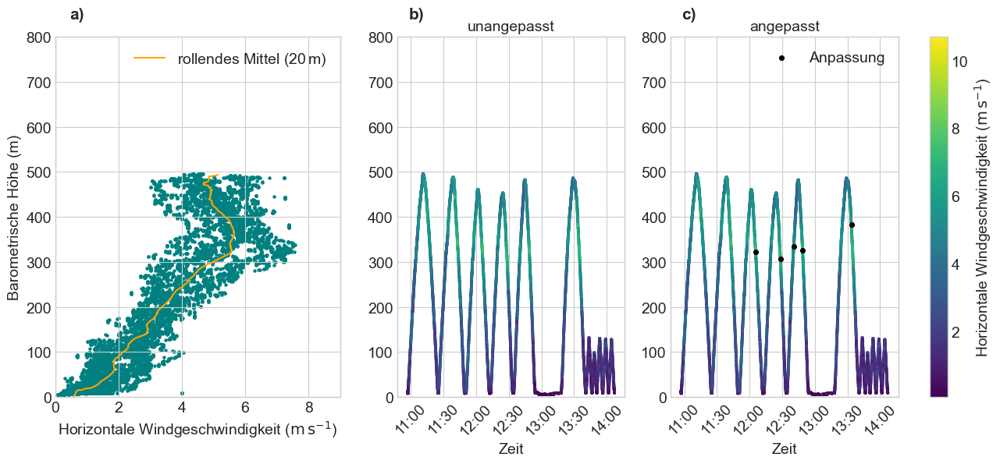

In [32]:
def plotfeld_tpm_flight_adjusted(flight=''):
    
    #read files
    ds = open_beluga_TMP_flight(flight)
    ws = ds['vv'].values
    z = ds['z_b'].values
    date=ds.attrs['flight_date']
    ds_mean = open_mean_profile(flight=flight)


    #create figure
    fig = plt.figure(figsize=(16,6))
    #fig.suptitle(flight + ': ' + date[0:4] +'-'+ date[4:6]+'-'+ date[6:8])


    ax1=fig.add_subplot(1,3,1)
    ax2=fig.add_subplot(1,3,2)
    ax3=fig.add_subplot(1,3,3)

    ax1.text(0.05, 1.05, 'a)', transform=ax1.transAxes, fontweight='bold', fontsize=15)
    ax2.text(0.05, 1.05, 'b)', transform=ax2.transAxes, fontweight='bold', fontsize=15)
    ax3.text(0.05, 1.05, 'c)', transform=ax3.transAxes, fontweight='bold', fontsize=15)

    ax1.scatter(ws, z, marker="o",s=5,color="teal", zorder=0)
    ax1.set_xlabel(r"Horizontale Windgeschwindigkeit ($\mathrm{m\,s}^{-1}$)")
    ax1.set_ylabel("Barometrische Höhe (m)")
    ax1.set_ylim(0,800)
    ax1.set_xlim(0,9)

    #mean profile
    ax1.plot(ds_mean['v'], ds_mean.index, label='rollendes Mittel (20$\,$m)', color='orange', zorder=1)
    
    #ax2    
    s1=ax2.scatter(ds.time,z,c=ws,cmap="viridis",marker="o",s=3)
    ax2.set_xlabel("Zeit")
    ax2.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))

    #ax3
    s2=ax3.scatter(ds.time,z,c=ws,cmap="viridis",marker="o",s=3)
    c=plt.colorbar(s2, ax=[ax2, ax3])
    c.set_label(r"Horizontale Windgeschwindigkeit ($\mathrm{m\,s}^{-1}$)")
    ax3.set_xlabel("Zeit")
    ax3.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))
    ax3.tick_params(axis='x', labelrotation=45)

    #add radiosonde data 
    #ax1.scatter(ds_rs['u_mean_rolling'], ds_rs['altitude'], color='black', s=8, zorder=2, label='Radiosondendaten')
    ax1.legend()


    #LLJ im Kontur (profilen) mit Zeitindex markieren
    # ds_llj_1, deltav, deltaz = flight_segment_analysis(flight=flight, adjusted=False)
    # if not ds_llj_1.empty:
    #     ax2.scatter(ds_llj_1['time'],ds_llj_1['z_max'], color='red',s=15,label='LLJ Kernhöhe')
    #     ax3.scatter(ds_llj_1['time'],ds_llj_1['z_max'], color='red',s=15, zorder=2)

    ds_llj_2, deltav, deltaz = flight_segment_analysis(flight=flight, adjusted=True)

    if not ds_llj_2.empty:
        for seg in ds_llj_2.segment:
            row = ds_llj_2[ds_llj_2.segment==seg]
            # if seg in ds_llj_1.segment:
            #     ax3.scatter(row['time'],row['z_max'],color='red',s=15, label='Anpassung', zorder=1)
            # else:
            if seg == ds_llj_2.segment.iloc[-1]:
                ax3.scatter(row['time'],row['z_max'],color='black',s=17, label='Anpassung', zorder=1)
            else:
                ax3.scatter(row['time'],row['z_max'],color='black',s=17, zorder=1)
                        
    ax2.legend()
    ax3.legend()
    ax2.set_ylim(0,800)
    ax3.set_ylim(0,800)
    ax2.tick_params(axis='x', labelrotation=45)
    #save figure 
    fig_name = flight + '_adjusted' 
    os.makedirs(os.getcwd()+ '/plots/flights/', exist_ok=True)
    plot_path = os.getcwd() +'/plots/flights/'
    ax2.set_title('unangepasst', fontsize=14)
    ax3.set_title('angepasst', fontsize=14)

    fig.savefig(plot_path + fig_name+'.png', bbox_inches='tight')

plotfeld_tpm_flight_adjusted(flight='RF11')
   

Error in callback <function _draw_all_if_interactive at 0x00000235DCF99260> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

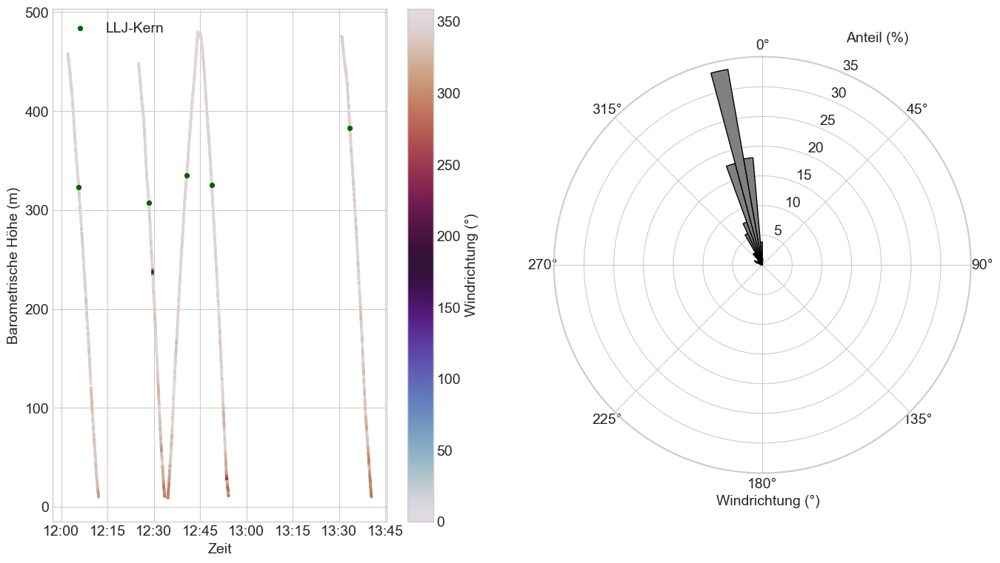

In [12]:
#Windplots


def wind_llj_seg(flight=''):
    #winddirection plot 

    df,deltav, deltaz = flight_segment_analysis(flight=flight)
    vdir_list = [] #list for calculated wind direction

    for seg in df['segment']:
        ds= open_beluga_TMP_flight(flight=flight)
        ds_seg = ds.where(ds['flight_segments']==seg, drop=True)
        dir = ds_seg['dd'].values
        # dir = (np.rad2deg(np.arctan2(ds_seg['u_lat'], ds_seg['u_lon'])).values)-180
        # dir = dir % 360
        vdir_list.append(
        {'dir': dir , 'time':ds_seg['time'].values, 'z_b': ds_seg['z_b'].values}
        )

    vdir_df = pd.DataFrame(vdir_list)

    fig = plt.figure(figsize=(16,9))
    ax1=fig.add_subplot(1,2,1)
    
    #plot every segment, vdir_df has 3 dims (variable, time, seg)
    for seg in vdir_df.index:
        s1 = ax1.scatter(vdir_df.loc[seg,'time'], vdir_df.loc[seg,'z_b'],c=vdir_df.loc[seg, 'dir'], s=3, cmap='twilight', vmin=0, vmax=359)  
    c1=fig.colorbar(s1, ax=ax1)
    ax1.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))
    ax1.set_xlabel('Zeit')
    ax1.set_ylabel('Barometrische Höhe (m)')
    c1.set_label('Windrichtung (°)')

    #polar plot
    ax2 = fig.add_subplot(1,2,2, projection='polar') 
    
    all_dirs = np.concatenate(vdir_df['dir'].values)
    theta = np.deg2rad(all_dirs)

    nbins = 72
    bins = np.linspace(0,2*np.pi, nbins+1)#divide polar plot into degree bins 

    counts, bin_edges =np.histogram(theta, bins=bins)
    counts = counts/counts.sum()*100
    width = 2*np.pi / nbins
    bin_centers = bin_edges[:-1] + width/2

    ax2.bar(bin_centers, counts, width=width, bottom=0.0, align='center', edgecolor='black', color='grey' )#farbe grau 
    ax2.set_theta_zero_location('N')
    ax2.set_theta_direction(-1)
    ax2.text(0.7, 1.06, 'Anteil (%)',transform=ax2.transAxes,ha='left', va='top',fontsize=14)
    ax2.text(0.39, -0.05, 'Windrichtung (°)',transform=ax2.transAxes,ha='left', va='top',fontsize=14)

    #mark llj cores
    ds_llj, deltav, deltaz = flight_segment_analysis(flight=flight)
    if not ds_llj.empty:
       ax1.scatter(ds_llj['time'],ds_llj['z_max'], color='darkgreen',s=18,label='LLJ-Kern')
       ax1.legend()

    #save figure 
    #path= r"C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\llj_wind"
    #plt.savefig(path + f'\llj_wind_flight_{flight}.png', bbox_inches='tight')
    
# for n in range (1,28):
#     if n == 6 or n==12 or n==13 or n==14 or n==15 or n==19 or n==21 or n==26:
#         wind_llj_seg(flight=f'RF{n:02d}')

wind_llj_seg(flight='RF11')

C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\3371014292.py:25: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.
  ds_all=xr.open_mfdataset(all_files_list,concat_dim="time",combine="nested")


Text(0.39, -0.05, 'Windrichtung (°)')

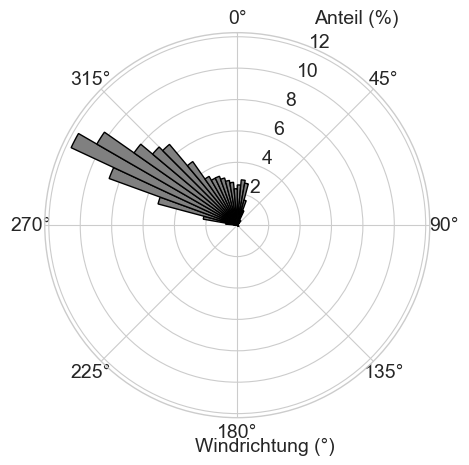

In [ ]:
#plot wind for whole dataset 
ds = open_all_beluga_TMP_flights()
fig = plt.figure(figsize=(5,5))
#polar plot
ax2 = fig.add_subplot(1,1,1, projection='polar') 
all_dirs = ds['dd'].values
theta = np.deg2rad(all_dirs)
nbins = 72
bins = np.linspace(0,2*np.pi, nbins+1)#divide polar plot into degree bins 
counts, bin_edges =np.histogram(theta, bins=bins)
counts = counts/counts.sum()*100
width = 2*np.pi / nbins
bin_centers = bin_edges[:-1] + width/2
ax2.bar(bin_centers, counts, width=width, bottom=0.0, align='center', edgecolor='black', color='grey' )#farbe grau 
ax2.set_theta_zero_location('N')
ax2.set_theta_direction(-1)
ax2.text(0.7, 1.06, 'Anteil (%)',transform=ax2.transAxes,ha='left', va='top',fontsize=14)
ax2.text(0.39, -0.05, 'Windrichtung (°)',transform=ax2.transAxes,ha='left', va='top',fontsize=14)


C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\3371014292.py:25: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.
  ds_all=xr.open_mfdataset(all_files_list,concat_dim="time",combine="nested")


Text(0.5, 1.08, 'LLJ')

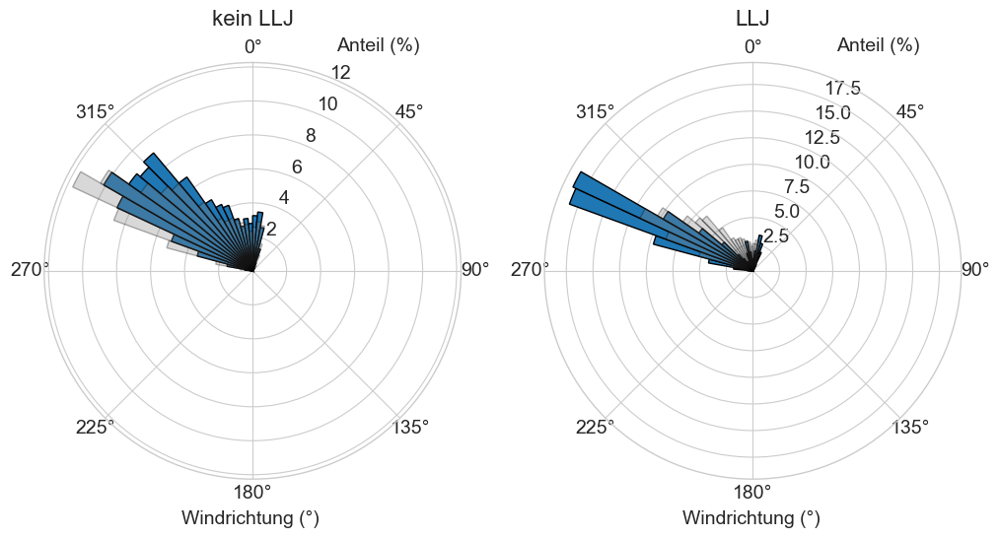

In [ ]:
#plot for llj and no llj flights 
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(1,2,1, projection='polar') 
ax2 = fig.add_subplot(1,2,2, projection='polar') 


def get_llj_dir():
    vdir_list = [] #list for wind direction
    for i, n in enumerate(llj_list):
        df,deltav, deltaz = flight_segment_analysis(flight=f'RF{n:02d}')
   
        for seg in df['segment']:
            ds= open_beluga_TMP_flight(flight=f'RF{n:02d}')
            ds_seg = ds.where(ds['flight_segments']==seg, drop=True)
            dir = ds_seg['dd'].values
            vdir_list.append(dir)

    return pd.DataFrame(vdir_list)


def get_no_llj_dir():
    vdir_list = [] #list for wind direction
    for i, n in enumerate(no_llj_list):
        ds= open_beluga_TMP_flight(flight=f'RF{n:02d}')
        dir = ds['dd'].values
        vdir_list.append(dir)
    return pd.DataFrame(vdir_list)


def plot_polar(ds, ax):

    all_dirs = ds.values
    theta = np.deg2rad(all_dirs)
    nbins = 72
    bins = np.linspace(0,2*np.pi, nbins+1)#divide polar plot into degree bins 
    counts, bin_edges =np.histogram(theta, bins=bins)
    counts = counts/counts.sum()*100
    width = 2*np.pi / nbins
    bin_centers = bin_edges[:-1] + width/2
    ax.bar(bin_centers, counts, width=width, bottom=0.0, align='center', edgecolor='black' )#farbe grau 
    ax.set_theta_zero_location('N')
    ax.set_theta_direction(-1)
    ax.text(0.7, 1.06, 'Anteil (%)',transform=ax.transAxes,ha='left', va='top',fontsize=14)
    ax.text(0.33, -0.075, 'Windrichtung (°)',transform=ax.transAxes,ha='left', va='top',fontsize=14)


plot_polar(get_llj_dir(), ax=ax2 )
plot_polar(get_no_llj_dir(), ax=ax1)
#links no llj, rechts llj 

#alle dirs hinterlegen: 
ds = open_all_beluga_TMP_flights()
all_dirs = ds['dd'].values
theta = np.deg2rad(all_dirs)
nbins = 72
bins = np.linspace(0,2*np.pi, nbins+1)#divide polar plot into degree bins 
counts, bin_edges =np.histogram(theta, bins=bins)
counts = counts/counts.sum()*100
width = 2*np.pi / nbins
bin_centers = bin_edges[:-1] + width/2
ax2.bar(bin_centers, counts, width=width, bottom=0.0, align='center', edgecolor='black', color='grey', alpha=0.3, label='komplett' )#farbe grau 
ax2.set_theta_zero_location('N')
ax2.set_theta_direction(-1)
ax1.bar(bin_centers, counts, width=width, bottom=0.0, align='center', edgecolor='black', color='grey', alpha=0.3, label='komplett' )#farbe grau 
ax1.set_theta_zero_location('N')
ax1.set_theta_direction(-1)

ax1.text(0.5, 1.08, 'kein LLJ' transform=ax1.transAxes, ha='center', va='bottom', fontsize=16)

ax2.text(0.5, 1.08, 'LLJ', transform=ax2.transAxes, ha='center', va='bottom', fontsize=16)

#fig.savefig(r"C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\polar_wind\polar_beluga", bbox_inches='tight')

In [ ]:
# carra_mean_profile(start='2024-03-26 19:30', end='2024-03-26 22:00', flug='06')
# carra_mean_profile(start='2024-03-30 11:59', end='2024-03-30 14:01', flug='11')
# carra_mean_profile(start='2024-04-01 09:30', end='2024-04-01 12:01', flug='12')
# carra_mean_profile(start='2024-04-01 12:30', end='2024-04-01 15:01', flug='13')
# carra_mean_profile(start='2024-04-01 15:40', end='2024-04-01 17:01', flug='14')
# carra_mean_profile(start='2024-04-02 08:59', end='2024-04-02 11:01', flug='15')
# carra_mean_profile(start='2024-04-06 14:59', end='2024-04-06 17:01', flug='21')
# carra_mean_profile(start='2024-04-04 14:59', end='2024-04-04 16:01', flug='19')
# carra_mean_profile(start='2024-04-10 09:59', end='2024-04-10 13:15', flug='26')


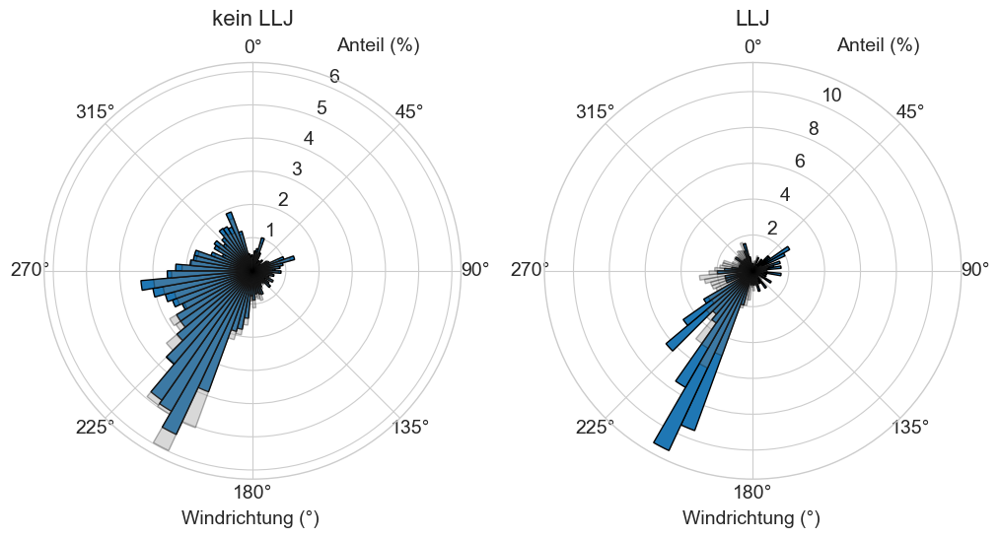

In [ ]:
#selber plot mit carra 

ds_06 = ds_carra.sel(valid_time=slice('2024-03-26 19:30', '2024-03-26 22:00'))
ds_11 = ds_carra.sel(valid_time=slice('2024-03-30 11:59', '2024-03-30 13:45'))
ds_12 = ds_carra.sel(valid_time=slice('2024-04-01 09:30', '2024-04-01 12:01'))

ds_13 = ds_carra.sel(valid_time=slice('2024-04-01 12:30', '2024-04-01 15:01'))
ds_14 = ds_carra.sel(valid_time=slice('2024-04-01 15:40', '2024-04-01 17:01'))
ds_15 = ds_carra.sel(valid_time=slice('2024-04-02 08:59', '2024-04-02 11:01'))

ds_21 = ds_carra.sel(valid_time=slice('2024-04-06 15:30', '2024-04-06 16:45'))
ds_19 = ds_carra.sel(valid_time=slice('2024-04-04 14:59', '2024-04-04 16:01'))
ds_26 = ds_carra.sel(valid_time=slice('2024-04-10 09:59', '2024-04-10 13:15'))

ds_06_nllj = ds_carra.sel(valid_time=slice('2024-03-26'))
ds_06_nllj = ds_06_nllj.sel(valid_time=~ds_06_nllj.valid_time.isin(ds_06.valid_time))
ds_11_nllj = ds_carra.sel(valid_time=slice('2024-03-30'))
ds_11_nllj = ds_11_nllj.sel(valid_time=~ds_11_nllj.valid_time.isin(ds_11.valid_time))
ds_12_nllj = ds_carra.sel(valid_time=slice('2024-04-01'))
ds_12_nllj = ds_12_nllj.sel(valid_time=~ds_12_nllj.valid_time.isin(ds_12.valid_time))
ds_13_nllj = ds_carra.sel(valid_time=slice('2024-04-01'))
ds_13_nllj = ds_13_nllj.sel(valid_time=~ds_13_nllj.valid_time.isin(ds_13.valid_time))
ds_14_nllj = ds_carra.sel(valid_time=slice('2024-04-01'))
ds_14_nllj = ds_14_nllj.sel(valid_time=~ds_14_nllj.valid_time.isin(ds_14.valid_time))
ds_15_nllj = ds_carra.sel(valid_time=slice('2024-04-02'))
ds_15_nllj = ds_15_nllj.sel(valid_time=~ds_15_nllj.valid_time.isin(ds_15.valid_time))
ds_19_nllj = ds_carra.sel(valid_time=slice('2024-04-04'))
ds_19_nllj = ds_19_nllj.sel(valid_time=~ds_19_nllj.valid_time.isin(ds_19.valid_time))
ds_21_nllj = ds_carra.sel(valid_time=slice('2024-04-06'))
ds_21_nllj = ds_21_nllj.sel(valid_time=~ds_21_nllj.valid_time.isin(ds_21.valid_time))
ds_26_nllj = ds_carra.sel(valid_time=slice('2024-04-10'))
ds_26_nllj = ds_26_nllj.sel(valid_time=~ds_26_nllj.valid_time.isin(ds_26.valid_time))
ds_0401=xr.concat([ds_12, ds_13, ds_14], dim='valid_time')
ds_0401_nllj=xr.concat([ds_12_nllj, ds_13_nllj, ds_14_nllj], dim='valid_time')

a, zmax_6 = mean_ws_llj(flight='RF06')
a, zmax_11= mean_ws_llj(flight='RF11')
a, zmax_12= mean_ws_llj(flight='RF12')
a, zmax_13= mean_ws_llj(flight='RF13')
a, zmax_14= mean_ws_llj(flight='RF14')
a, zmax_15= mean_ws_llj(flight='RF15')
a, zmax_19= mean_ws_llj(flight='RF19')
a, zmax_21= mean_ws_llj(flight='RF21')
a, zmax_26= mean_ws_llj(flight='RF26')

ds_llj = xr.concat([ds_06, ds_11, ds_12, ds_13, ds_14, ds_15, ds_19, ds_21, ds_26 ], dim='valid_time')
ds_llj

time_mask = ~ds_carra.valid_time.isin(ds_llj.valid_time)
ds_nllj = ds_carra.sel(valid_time=time_mask)
ds_nllj = ds_nllj.sel(valid_time=slice('2024-03-26', '2026-04-11'))
dir_llj_list = []
dir_nllj_list = []
dir_llj_list = dir_llj_list.append(ds_llj['wdir'].values)
dir_nllj_list = dir_nllj_list.append(ds_nllj['wdir'].values)

df_llj = pd.DataFrame(dir_llj_list)
df_nllj = pd.DataFrame(dir_nllj_list)

fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(1,2,1, projection='polar') 
ax2 = fig.add_subplot(1,2,2, projection='polar') 

plot_polar(ds=ds_nllj['wdir'], ax=ax1)
plot_polar(ds=ds_llj['wdir'],ax=ax2)

#alle dirs hinterlegen: 
all_dirs = ds_carra['wdir'].values
theta = np.deg2rad(all_dirs)

nbins = 72
bins = np.linspace(0,2*np.pi, nbins+1)#divide polar plot into degree bins 
counts, bin_edges =np.histogram(theta, bins=bins)
counts = counts/counts.sum()*100
width = 2*np.pi / nbins
bin_centers = bin_edges[:-1] + width/2

ax2.bar(bin_centers, counts, width=width, bottom=0.0, align='center', edgecolor='black', color='grey', alpha=0.3, label='komplett' )#farbe grau 
ax2.set_theta_zero_location('N')
ax2.set_theta_direction(-1)
ax1.bar(bin_centers, counts, width=width, bottom=0.0, align='center', edgecolor='black', color='grey', alpha=0.3, label='komplett' )#farbe grau 
ax1.set_theta_zero_location('N')
ax1.set_theta_direction(-1)
ax1.text(0.5, 1.08, 'kein LLJ',transform=ax1.transAxes, ha='center', va='bottom', fontsize=16)

ax2.text(0.5, 1.08, 'LLJ',transform=ax2.transAxes, ha='center', va='bottom', fontsize=16)

fig.savefig(r"C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\polar_wind\polar_carra", bbox_inches='tight')

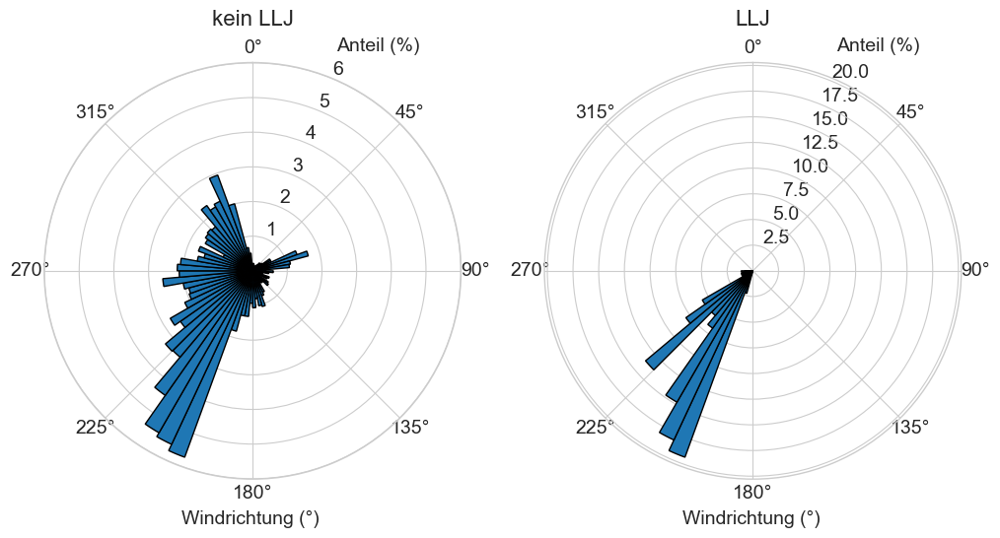

In [ ]:
#plot carra nllj und llj dir 

fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(1,2,1, projection='polar')
ax2 = fig.add_subplot(1,2,2, projection='polar')

plot_polar(ds=ds_0401['wdir'], ax=ax2)
plot_polar(ds=ds_0401_nllj['wdir'],ax=ax1)
ax1.text(0.5, 1.08, 'kein LLJ',
         transform=ax1.transAxes,
         ha='center', va='bottom',
         fontsize=16)

ax2.text(0.5, 1.08, 'LLJ', transform=ax2.transAxes, ha='center', va='bottom', fontsize=16)

fig.savefig(r"C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\polar_wind\0401.png", bbox_inches='tight')



C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\3371014292.py:25: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.
  ds_all=xr.open_mfdataset(all_files_list,concat_dim="time",combine="nested")


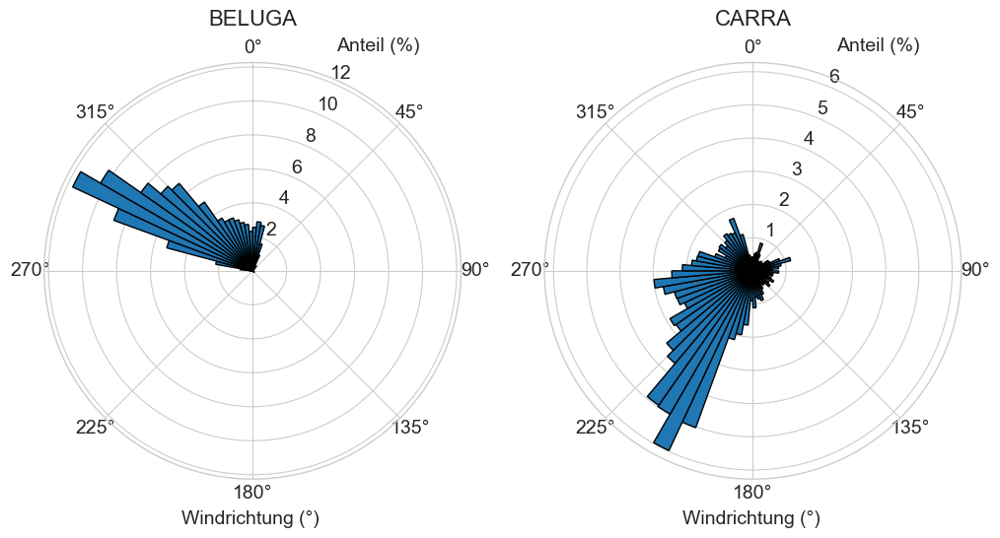

In [ ]:
#carra all winddirs vs beluga all winddirs

#selber plot mit carra 
all_dirs_beluga= open_all_beluga_TMP_flights()['dd']
all_dirs = ds_carra['wdir']

fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(1,2,1, projection='polar') 
ax2 = fig.add_subplot(1,2,2, projection='polar') 

plot_polar(ds=all_dirs_beluga, ax=ax1)
plot_polar(ds=all_dirs, ax=ax2)

ax1.text(0.5, 1.08, 'BELUGA', transform=ax1.transAxes, ha='center', va='bottom', fontsize=16)

ax2.text(0.5, 1.08, 'CARRA', transform=ax2.transAxes, ha='center', va='bottom', fontsize=16)

fig.savefig(r"C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\polar_wind\polar_carra_beluga", bbox_inches='tight')



<>:49: SyntaxWarning: invalid escape sequence '\m'
<>:49: SyntaxWarning: invalid escape sequence '\m'
C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\1496624680.py:49: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_xlabel('Horizontale Windgeschwindigkeit ($\mathrm{m\,s}^{-1}$)')


Text(0.5, 0, 'Windrichtung (°)')

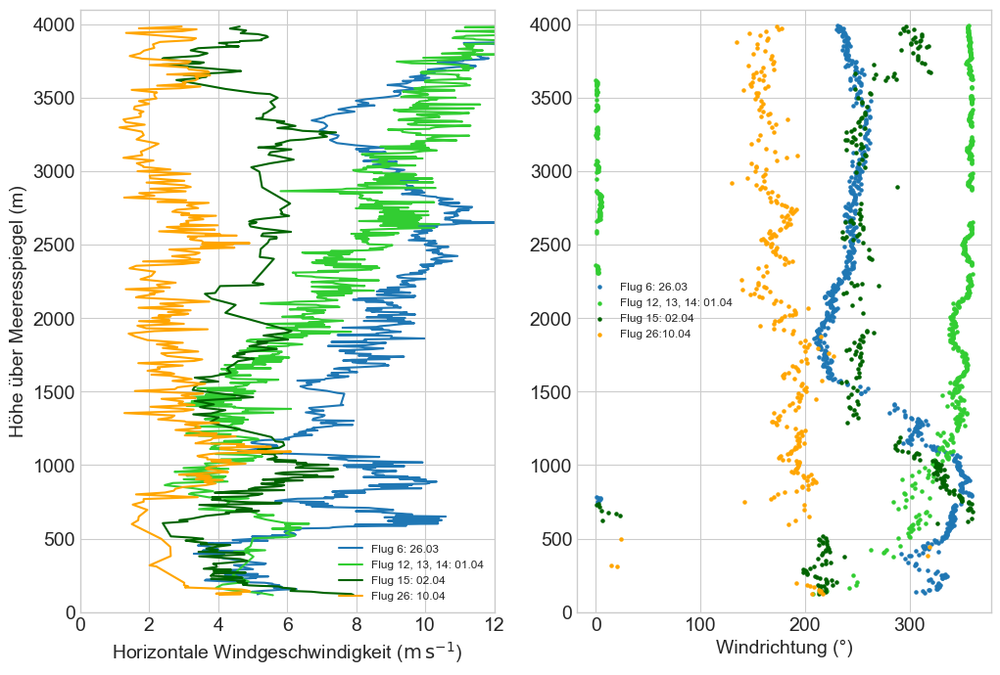

In [ ]:
#radiosone plot 
def radiosonde_mean_dir (flight='', window=4, dz_dir=5):

    ds=open_radiosonde_data(flight=flight)
    ds = ds.where((ds['altitude']<=4000), drop=True) 
    ds= ds.where(ds['altitude']>=100, drop=True)
    ds = ds.swap_dims({'time':'altitude'})
    ds= ds.dropna(dim='altitude')
    ds['u_mean_rolling'] = np.sqrt((ds['u']**2)+(ds['v']**2))
    #u und v std muss noch fortgepflanzt werden 
    ds['u_mean_rolling'] = ds['u_mean_rolling'].rolling( altitude=window, center=True).mean()
    ds['u_mean_rolling_std']=ds['u_mean_rolling'].rolling( altitude=window, center=True).std()
    ds['dir']=((np.rad2deg(np.arctan2(ds['u'], ds['v'])))-180)%360

    dir_bins = np.arange(ds['altitude'].min(), ds['altitude'].max()+dz_dir, dz_dir)
    ds = ds.assign_coords(zs=('altitude',pd.cut(ds.altitude.values,bins=dir_bins,labels=dir_bins[:-1])))
    ds = ds.dropna(dim='altitude', subset=['zs'])
    # Rolling Mean der Windkomponenten
    ds['u_roll'] = ds['u'].rolling(altitude=window, center=True).mean()
    ds['v_roll'] = ds['v'].rolling(altitude=window, center=True).mean()

    ds['u_roll_std']= ds['u'].rolling(altitude=window, center=True).std()
    ds['v_roll_std'] = ds['v'].rolling(altitude=window, center=True).std()


    #fehler der windrichtung: Fortpflanzung in Zelle
    ds['mean_dir'] = (np.rad2deg(np.arctan2(ds['u_roll'], ds['v_roll'])) - 180) % 360
    ds['mean_dir_std']=np.rad2deg(np.sqrt(((ds['v_roll']/(ds['u_roll']**2+ds['v_roll']**2))*ds['u_roll_std'])**2+((ds['u_roll']/(ds['u_roll']**2+ds['v_roll']**2))*ds['v_roll_std'])**2))
   

    ds = ds.where((ds['dir']<=89) | (ds['dir']>=91), drop=True) 
    ds = ds.where((ds['dir']<=269) | (ds['dir']>=271 ), drop=True) #|: nur eine condition muss erfüllt sein, &: beide müssen erfüllt sein. --> obv funktioniert nicht   #anders rum lol 
    
    return ds

fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)
ax1.set_xlim(0,12)
ax1.set_ylim(0,4100)
ax2.set_ylim(0,4100)

#ws
ax1.plot(radiosonde_mean_dir(flight='RF06')['u_mean_rolling'],radiosonde_mean_dir(flight='RF06')['altitude'], label='Flug 6: 26.03')
ax1.plot(radiosonde_mean_dir(flight='RF12')['u_mean_rolling'],radiosonde_mean_dir(flight='RF12')['altitude'], color='limegreen', label='Flug 12, 13, 14: 01.04')
ax1.plot(radiosonde_mean_dir(flight='RF15')['u_mean_rolling'],radiosonde_mean_dir(flight='RF15')['altitude'], color='darkgreen', label='Flug 15: 02.04')
ax1.plot(radiosonde_mean_dir(flight='RF26')['u_mean_rolling'],radiosonde_mean_dir(flight='RF26')['altitude'], color='orange', label='Flug 26: 10.04')
ax1.legend(prop={'size':8.5})
ax1.set_xlabel('Horizontale Windgeschwindigkeit ($\mathrm{m\,s}^{-1}$)')
ax1.set_ylabel('Höhe über Meeresspiegel (m)')

#dir
ax2.scatter(radiosonde_mean_dir(flight='RF06')['mean_dir'],radiosonde_mean_dir(flight='RF06')['altitude'], label='Flug 6: 26.03', s=5)
ax2.scatter(radiosonde_mean_dir(flight='RF12')['mean_dir'],radiosonde_mean_dir(flight='RF12')['altitude'], color='limegreen', label='Flug 12, 13, 14: 01.04', s=5)
ax2.scatter(radiosonde_mean_dir(flight='RF15')['mean_dir'],radiosonde_mean_dir(flight='RF15')['altitude'], color='darkgreen', label='Flug 15: 02.04', s=5)
ax2.scatter(radiosonde_mean_dir(flight='RF26')['mean_dir'],radiosonde_mean_dir(flight='RF26')['altitude'], color='orange', label='Flug 26:10.04', s=5)
ax2.legend(prop={'size':8.5})
ax2.set_xlabel('Windrichtung (°)')



#fig.savefig(r"C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\radio_wind.png", bbox_inches='tight')
#print('saved')
#plt.close()


Fortpflanzung Windrichtungsfehler: 
$\phi=\arctan(\frac{u}{v})$


mit Fehler von u und v: 

$\Delta\phi_u=\frac{\partial \phi}{\partial u}\sigma_u=\frac{v}{u^2+v^2}\sigma_u$ 

$\Delta\phi_v=\frac{\partial \phi}{\partial v}\sigma_v=-\frac{u}{u^2+v^2}\sigma_v$

Gesamtfehler: 

$\Delta\phi=\sqrt{(\frac{v}{u^2+v^2}\sigma_u)^2+(-\frac{u}{u^2+v^2}\sigma_v)^2}$


<>:7: SyntaxWarning: invalid escape sequence '\m'
<>:8: SyntaxWarning: invalid escape sequence '\m'
<>:138: SyntaxWarning: invalid escape sequence '\m'
<>:7: SyntaxWarning: invalid escape sequence '\m'
<>:8: SyntaxWarning: invalid escape sequence '\m'
<>:138: SyntaxWarning: invalid escape sequence '\m'
C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\741388647.py:7: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_xlabel('Horizontale Windgeschwindigkeit ($\mathrm{m\,s}^{-1}$)')
C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\741388647.py:8: SyntaxWarning: invalid escape sequence '\m'
  ax2.set_xlabel('Horizontale Windgeschwindigkeit ($\mathrm{m\,s}^{-1}$)')
C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\741388647.py:138: SyntaxWarning: invalid escape sequence '\m'
  ax2.set_ylabel('Normalisierte, barometrische Höhe$~(\mathrm{z/z_{LLJ}})$' )


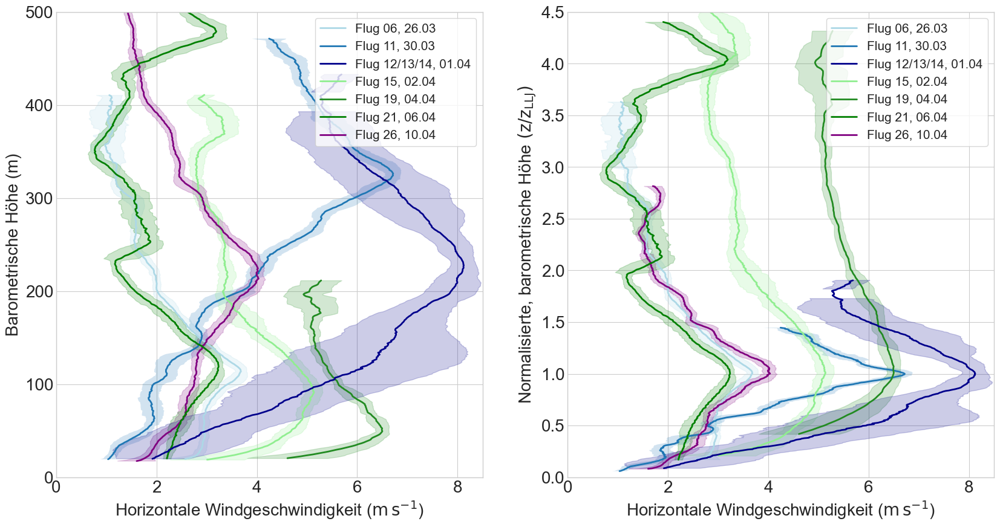

In [ ]:

#mean LLJ-Profiles for LLJ case 
def mean_llj_profiles():
    fig = plt.figure(figsize=(20,10))
    ax1 = fig.add_subplot(1,2,1)
    ax2 = fig.add_subplot(1,2,2)
    ax1.set_ylabel('Barometrische Höhe (m)')
    ax1.set_xlabel('Horizontale Windgeschwindigkeit ($\mathrm{m\,s}^{-1}$)')
    ax2.set_xlabel('Horizontale Windgeschwindigkeit ($\mathrm{m\,s}^{-1}$)')
    
    llj_num = [6,11,12,13,14,15,26,19,21]

    for n in llj_num:
    
        ds = open_beluga_TMP_flight(flight=f'RF{n:02d}')

        df, deltav, deltaz = flight_segment_analysis(flight=f'RF{n:02d}')
        valid_segs = np.array(df['segment'])

        profile = []
        for seg, ds_seg in ds.groupby('flight_segments'):
            if not seg in valid_segs:
                continue 

            mask = np.isfinite(ds_seg['vv']) & np.isfinite(ds_seg['z_b'])#only use valid values 
            z = ds_seg['z_b'].values[mask]
            vv = ds_seg['vv'].values[mask]

            df_a = pd.DataFrame(
                {'segment': seg, 'z': z, 'vv': vv}
            )
            profile.append(df_a)

        #add to one dataframe
        df_segs = pd.concat(profile, ignore_index=True)

        #create bins
        dz = 1 #every m 1 value because of different profile quantity per flight --> running mean must be over a normalized variable 
        z_grid = np.arange(df_segs['z'].min(), df_segs['z'].max() + dz, dz) 
        df_segs['z_bin'] = pd.cut(df_segs['z'], bins=z_grid, labels=z_grid[:-1]) 

        #mean for every bin 
        seg_mean = (df_segs.groupby('z_bin', observed=True)['vv'].mean().reset_index())
        seg_mean['z']=seg_mean['z_bin'].astype(float)+dz/2
        window = 20
        #calc running mean 
        seg_mean['vv_rmean'] = (seg_mean['vv'].rolling(window=window, center=True).mean())
        seg_mean['std']=(seg_mean['vv'].rolling(window=window, center=True).std())
        seg_mean = seg_mean.where(seg_mean['z']<=600)
        seg_mean_llj_ind = seg_mean['vv_rmean'].idxmax()
        llj_height = seg_mean['z_bin'][seg_mean_llj_ind] 

        if n ==6: 
            ax1.plot(seg_mean['vv_rmean'], seg_mean['z'], label=f'Flug {n:02d}, 26.03 ', linewidth=2, color='lightblue')
            ax1.fill_betweenx(seg_mean['z'], seg_mean['vv_rmean']+seg_mean['std'], seg_mean['vv_rmean']-seg_mean['std'], color='lightblue', alpha=0.2)
            ax2.plot(seg_mean['vv_rmean'], seg_mean['z']/llj_height, label=f'Flug {n:02d}, 26.03 ', linewidth=2, color='lightblue')
            ax2.fill_betweenx(seg_mean['z']/llj_height, seg_mean['vv_rmean']+seg_mean['std'], seg_mean['vv_rmean']-seg_mean['std'], color='lightblue', alpha=0.2)
        if n == 11:
            ax1.plot(seg_mean['vv_rmean'], seg_mean['z'], label=f'Flug {n:02d}, 30.03', linewidth=2, )
            ax1.fill_betweenx(seg_mean['z'], seg_mean['vv_rmean']+seg_mean['std'], seg_mean['vv_rmean']-seg_mean['std'], alpha=0.2)
            ax2.plot(seg_mean['vv_rmean'], seg_mean['z']/llj_height, label=f'Flug {n:02d}, 30.03', linewidth=2, )
            ax2.fill_betweenx(seg_mean['z']/llj_height, seg_mean['vv_rmean']+seg_mean['std'], seg_mean['vv_rmean']-seg_mean['std'], alpha=0.2)
        if n ==15: 
            ax1.plot(seg_mean['vv_rmean'], seg_mean['z'], label=f'Flug {n:02d}, 02.04', linewidth=2,color='lightgreen' )
            ax1.fill_betweenx(seg_mean['z'], seg_mean['vv_rmean']+seg_mean['std'], seg_mean['vv_rmean']-seg_mean['std'], color='lightgreen',  alpha=0.2)
            ax2.plot(seg_mean['vv_rmean'], seg_mean['z']/llj_height, label=f'Flug {n:02d}, 02.04', linewidth=2,color='lightgreen' )
            ax2.fill_betweenx(seg_mean['z']/llj_height, seg_mean['vv_rmean']+seg_mean['std'], seg_mean['vv_rmean']-seg_mean['std'], color='lightgreen',  alpha=0.2)
        if n == 19:
            ax1.plot(seg_mean['vv_rmean'], seg_mean['z'], label=f'Flug {n:02d}, 04.04', linewidth=2, color='forestgreen')
            ax1.fill_betweenx(seg_mean['z'], seg_mean['vv_rmean']+seg_mean['std'], seg_mean['vv_rmean']-seg_mean['std'], color='forestgreen',  alpha=0.2)
            ax2.plot(seg_mean['vv_rmean'], seg_mean['z']/llj_height, label=f'Flug {n:02d}, 04.04', linewidth=2, color='forestgreen')
            ax2.fill_betweenx(seg_mean['z']/llj_height, seg_mean['vv_rmean']+seg_mean['std'], seg_mean['vv_rmean']-seg_mean['std'], color='forestgreen',  alpha=0.2)
        if n == 21:
            ax1.plot(seg_mean['vv_rmean'], seg_mean['z'], label=f'Flug {n:02d}, 06.04', linewidth=2, color='green')
            ax1.fill_betweenx(seg_mean['z'], seg_mean['vv_rmean']+seg_mean['std'], seg_mean['vv_rmean']-seg_mean['std'], color='green',  alpha=0.2)
            ax2.plot(seg_mean['vv_rmean'], seg_mean['z']/llj_height, label=f'Flug {n:02d}, 06.04', linewidth=2, color='green')
            ax2.fill_betweenx(seg_mean['z']/llj_height, seg_mean['vv_rmean']+seg_mean['std'], seg_mean['vv_rmean']-seg_mean['std'], color='green',  alpha=0.2)
        if n == 26:
            ax1.plot(seg_mean['vv_rmean'], seg_mean['z'], label=f'Flug {n:02d}, 10.04', linewidth=2, color='purple')
            ax1.fill_betweenx(seg_mean['z'], seg_mean['vv_rmean']+seg_mean['std'], seg_mean['vv_rmean']-seg_mean['std'], color='purple', alpha=0.2)
            ax2.plot(seg_mean['vv_rmean'], seg_mean['z']/llj_height, label=f'Flug {n:02d}, 10.04', linewidth=2, color='purple')
            ax2.fill_betweenx(seg_mean['z']/llj_height, seg_mean['vv_rmean']+seg_mean['std'], seg_mean['vv_rmean']-seg_mean['std'], color='purple', alpha=0.2)




    merge = [12,13,14]

    for n in merge:
        ds = open_beluga_TMP_flight(flight=f'RF{n:02d}')
        df, deltav, deltaz = flight_segment_analysis(flight=f'RF{n:02d}')
        valid_segs = np.array(df['segment'])

        profile = []
        for seg, ds_seg in ds.groupby('flight_segments'):
            if not seg in valid_segs:
                continue 

            mask = np.isfinite(ds_seg['vv']) & np.isfinite(ds_seg['z_b'])#only use valid values 
            z = ds_seg['z_b'].values[mask]
            vv = ds_seg['vv'].values[mask]

            df_a = pd.DataFrame(
                {'segment': seg, 'z': z, 'vv': vv}
            )

            profile.append(df_a)

    #add to one dataframe
    df_segs = pd.concat(profile, ignore_index=True)

    #create bins
    dz = 1 #every m 1 value because of different profile quantity per flight --> running mean must be over a normalized variable 
    z_grid = np.arange(df_segs['z'].min(), df_segs['z'].max() + dz, dz) 
    df_segs['z_bin'] = pd.cut(df_segs['z'], bins=z_grid, labels=z_grid[:-1]) 

    #mean for every bin 
    seg_mean = (df_segs.groupby('z_bin', observed=True)['vv'].mean().reset_index())
    seg_mean['z']=seg_mean['z_bin'].astype(float)+dz/2
    window = 20
    #calc running mean 
    seg_mean['vv_rmean'] = (seg_mean['vv'].rolling(window=window, center=True).mean())
    seg_mean['std'] = (df_segs.groupby('z_bin', observed=True)['vv'].std().values)
    seg_mean['std'] = (seg_mean['std'].rolling(window=window, center=True).mean())
    
    seg_mean = seg_mean.where(seg_mean['z']<=600)
    seg_mean_llj_ind = seg_mean['vv_rmean'].idxmax()
    llj_height = seg_mean['z_bin'][seg_mean_llj_ind] 

    ax1.plot(seg_mean['vv_rmean'], seg_mean['z'], label='Flug 12/13/14, 01.04', linewidth=2, color='darkblue')
    ax1.fill_betweenx(seg_mean['z'], seg_mean['vv_rmean']+seg_mean['std'], seg_mean['vv_rmean']-seg_mean['std'], color='darkblue', alpha=0.2)
    ax2.plot(seg_mean['vv_rmean'], seg_mean['z']/llj_height, label='Flug 12/13/14, 01.04' , linewidth=2, color='darkblue')
    ax2.fill_betweenx(seg_mean['z']/llj_height, seg_mean['vv_rmean']+seg_mean['std'], seg_mean['vv_rmean']-seg_mean['std'], color='darkblue', alpha=0.2)

    ax1.set_ylim(0,500)
    ax1.set_xlim(0,8.5)
    ax2.set_xlim(0,8.5)
    ax2.set_ylim(0,4.5)
    ax2.set_ylabel('Normalisierte, barometrische Höhe$~(\mathrm{z/z_{LLJ}})$' )
    handles, labels = ax1.get_legend_handles_labels()

    dates = [pd.to_datetime(label.split(',')[-1].strip(),format='%d.%m')for label in labels]
    order = np.argsort(dates)

    ax1.legend([handles[i] for i in order],[labels[i] for i in order],loc='upper right',fontsize=15, frameon=True)
    ax2.legend([handles[i] for i in order],[labels[i] for i in order],loc='upper right',fontsize=15, frameon=True)
    
    ax1.tick_params(axis='both', labelsize=20)
    ax2.tick_params(axis='both', labelsize=20)
    ax1.xaxis.label.set_size(20)
    ax1.yaxis.label.set_size(20)
    ax2.xaxis.label.set_size(20)
    ax2.yaxis.label.set_size(20)  
    fig.savefig(r'C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\llj_mean_profile_comp.png', bbox_inches='tight')
    ax1.set_title('')
    #print('saved')
    #plt.close()
mean_llj_profiles()

<>:75: SyntaxWarning: invalid escape sequence '\m'
<>:75: SyntaxWarning: invalid escape sequence '\m'
C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\2332340216.py:75: SyntaxWarning: invalid escape sequence '\m'
  plt.xlabel('Horizontale Windgeschwindigkeit ($\mathrm{m\,s^{-1}}$)')


flight06 done
flight11 done
flight12 done
flight13 done
flight14 done
flight15 done
flight19 done
flight21 done
flight26 done
flight01 done
flight02 done
flight03 done
flight05 done
flight07 done
flight08 done
flight10 done
flight16 done
flight17 done
flight18 done
flight20 done
flight22 done
flight23 done
flight24 done
flight25 done
flight27 done


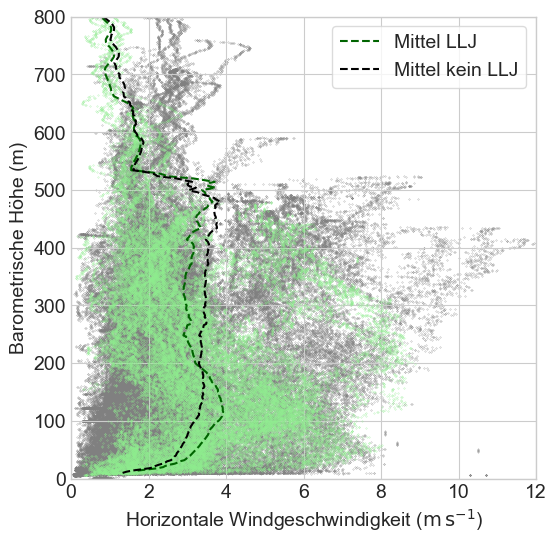

In [ ]:
#highlight llj-profiles: #mal mit allen probieren
plt.figure(figsize=(6,6))
 
llj_vv = []
llj_z_b =[]
no_llj_vv=[]
no_llj_z_b =[]
for n in llj_list:
    df,x,y = flight_segment_analysis(flight=f'RF{n:02d}')
    ds = open_beluga_TMP_flight(flight=f'RF{n:02d}')
    for seg in np.unique(ds['flight_segments']):
        mask =ds['flight_segments'] == seg 
        if seg in df['segment'].values:
            plt.scatter(ds['vv'].where(mask), ds['z_b'].where(mask), color='lightgreen', s=0.04, zorder=1)
            llj_vv.append(ds['vv'].values)
            llj_z_b.append(ds['z_b'].values)
        else:
            plt.scatter(ds['vv'].where(mask), ds['z_b'].where(mask), color='grey', s=0.04, zorder=0)
            no_llj_vv.append(ds['vv'].values)
            no_llj_z_b.append(ds['z_b'].values)
    print(f'flight{n:02d} done')

for n in no_llj_list:
    ds = open_beluga_TMP_flight(flight=f'RF{n:02d}')
    plt.scatter(ds['vv'], ds['z_b'], color='grey', s=0.04, zorder=0)
    no_llj_vv.append(ds['vv'].values)
    no_llj_z_b.append(ds['z_b'].values)
    print(f'flight{n:02d} done')



df_means_llj = pd.DataFrame(
    {
    'vvllj':llj_vv, 'zbllj':llj_z_b
})

df_means_no_llj = pd.DataFrame(
    {'vvnllj': no_llj_vv, 'zbnllj':no_llj_z_b}
)

#jeder Eintag hat ein ganzes Profil-->concat 
df_means_llj = pd.DataFrame({
    'vvllj': np.concatenate(df_means_llj['vvllj'].values),
    'zbllj':  np.concatenate(df_means_llj['zbllj'].values)
})

df_means_no_llj = pd.DataFrame({
    'vvnllj': np.concatenate(df_means_no_llj['vvnllj'].values),
    'zbnllj':  np.concatenate(df_means_no_llj['zbnllj'].values) 
})


#2m bins 
df_means_llj['z_bin']=(df_means_llj['zbllj'] // 2) * 2
df_means_no_llj['z_bin']=(df_means_no_llj['zbnllj'] // 2) * 2


df_means_llj=(df_means_llj.groupby('z_bin', as_index=False)['vvllj'].agg(vv_mean='mean', vv_std='std'))
df_means_no_llj = (df_means_no_llj.groupby('z_bin', as_index=False)['vvnllj'].agg(vv_mean='mean', vv_std='std'))
llj_std = df_means_llj['vv_std']
nllj_std = df_means_llj['vv_std']

#rolling mean für glättung (20m)
llj_mean = df_means_llj['vv_mean'].rolling(window=10, center=True).mean()
nllj_mean = df_means_no_llj['vv_mean'].rolling(window=10, center=True).mean()


plt.plot(llj_mean, df_means_llj['z_bin'], linestyle='--', linewidth=1.5, color='darkgreen', label='Mittel LLJ')
plt.plot(nllj_mean, df_means_no_llj['z_bin'], linestyle='--', linewidth=1.5, color='black', label='Mittel kein LLJ')
# plt.fill_betweenx( df_means_llj['z_bin'], llj_mean-llj_std, llj_mean+llj_std, color='darkgreen', alpha=0.2)
# plt.fill_betweenx(df_means_no_llj['z_bin'], nllj_mean-nllj_std, nllj_mean +nllj_std, color='black', alpha = 0.2)

plt.xlim(0,12)
plt.ylim(0,800)
plt.xlabel('Horizontale Windgeschwindigkeit ($\mathrm{m\,s^{-1}}$)')
plt.ylabel('Barometrische Höhe (m)')
plt.legend(frameon=True, loc='upper right', edgecolor='lightgrey')
plt.savefig(r'C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\profile.png', bbox_inches='tight')



<>:8: SyntaxWarning: invalid escape sequence '\m'
<>:8: SyntaxWarning: invalid escape sequence '\m'
C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\871810696.py:8: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_xlabel('LLJ-Stärke ($\mathrm{m\,s}^{-1}$)')


saved


(TtestResult(statistic=np.float64(-58.37147194752175), pvalue=np.float64(1.2780991733247195e-25), df=np.float64(22.0)),
 None)

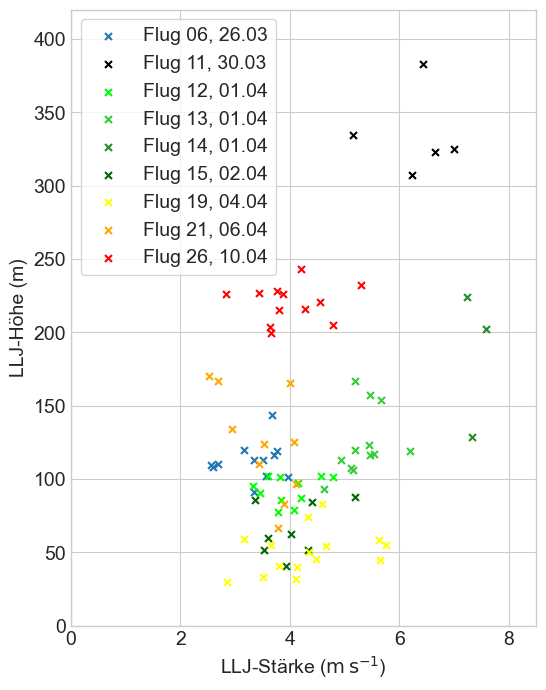

In [ ]:
#plot LLJ height over time and strength over time 
def llj_v_z_korr():
    fig = plt.figure(figsize=(6,8))
    ax1 = fig.add_subplot(1,1,1)
    ax1.set_ylim(0,420)
    ax1.set_xlim(0,8.5)
    ax1.set_ylabel('LLJ-Höhe (m)')
    ax1.set_xlabel('LLJ-Stärke ($\mathrm{m\,s}^{-1}$)')

    for n in range (0,28):
        if n ==12:
            df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
            ax1.scatter(df['llj_strength'], df['z_max'], color='lime', s=25, label='Flug 12, 01.04', marker='x')
        if n ==13:
            df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
            ax1.scatter(df['llj_strength'], df['z_max'], color='limegreen', s=25, label='Flug 13, 01.04', marker='x')
        if n ==14:
            df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
            ax1.scatter(df['llj_strength'], df['z_max'], color='forestgreen', s=25 ,label='Flug 14, 01.04', marker='x')
        if n ==15:
            df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
            ax1.scatter(df['llj_strength'], df['z_max'], color='darkgreen', s=25, label='Flug 15, 02.04', marker='x')
        if n ==6:
           df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
           ax1.scatter(df['llj_strength'], df['z_max'], s=25,  label='Flug 06, 26.03', marker='x')
        if n ==26:
            df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
            ax1.scatter(df['llj_strength'], df['z_max'], color='red', s=25, label='Flug 26, 10.04', marker='x')
        if n == 11:
            df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
            ax1.scatter(df['llj_strength'], df['z_max'], color='black', s=25, label='Flug 11, 30.03', marker='x')
        if n == 19:
            df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
            ax1.scatter(df['llj_strength'], df['z_max'], color='yellow', s=25, label='Flug 19, 04.04', marker='x')
        if n == 21:
            df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
            ax1.scatter(df['llj_strength'], df['z_max'], color='orange', s=25, label='Flug 21, 06.04', marker='x')
    ax1.legend(frameon=True)
    ttest = sc.ttest_ind(df['llj_strength'], df['z_max'])
    fig.savefig(r'C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\LLJ_korr\z_v_llj_korr.png', bbox_inches='tight')

    return ttest, print('saved')


llj_v_z_korr()



    


<>:8: SyntaxWarning: invalid escape sequence '\m'
<>:8: SyntaxWarning: invalid escape sequence '\m'
C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\588726124.py:8: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_xlabel('LLJ-Kerngeschwindigkeit ($\mathrm{m\,s}^{-1}$)')


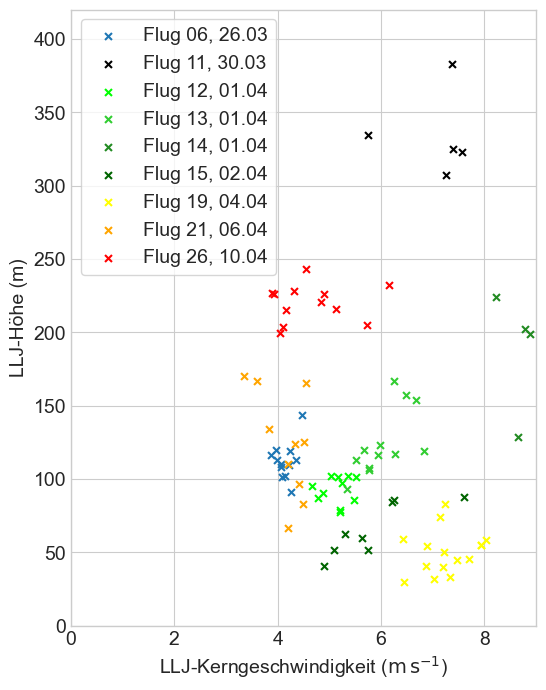

In [ ]:
#plot LLJ height over time and strength over time 
def llj_v_z_korr_vmax():
    fig = plt.figure(figsize=(6,8))
    ax1 = fig.add_subplot(1,1,1)
    ax1.set_ylim(0,420)
    ax1.set_xlim(0,9)
    ax1.set_ylabel('LLJ-Höhe (m)')
    ax1.set_xlabel('LLJ-Kerngeschwindigkeit ($\mathrm{m\,s}^{-1}$)')

    for n in range (0,28):
        if n ==12:
            df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
            ax1.scatter(df['v_max'], df['z_max'], color='lime', s=25, label='Flug 12, 01.04', marker='x')
        if n ==13:
            df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
            ax1.scatter(df['v_max'], df['z_max'], color='limegreen', s=25, label='Flug 13, 01.04', marker='x')
        if n ==14:
            df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
            ax1.scatter(df['v_max'], df['z_max'], color='forestgreen', s=25 ,label='Flug 14, 01.04', marker='x')
        if n ==15:
            df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
            ax1.scatter(df['v_max'], df['z_max'], color='darkgreen', s=25, label='Flug 15, 02.04', marker='x')
        if n ==6:
           df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
           ax1.scatter(df['v_max'], df['z_max'], s=25,  label='Flug 06, 26.03', marker='x')
        if n ==26:
            df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
            ax1.scatter(df['v_max'], df['z_max'], color='red', s=25, label='Flug 26, 10.04', marker='x')
        if n == 11:
            df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
            ax1.scatter(df['v_max'], df['z_max'], color='black', s=25, label='Flug 11, 30.03', marker='x')
        if n == 19:
            df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
            ax1.scatter(df['v_max'], df['z_max'], color='yellow', s=25, label='Flug 19, 04.04', marker='x')
        if n == 21:
            df, delta_v, delta_z = flight_segment_analysis(flight=f'RF{n:02d}')                                    
            ax1.scatter(df['v_max'], df['z_max'], color='orange', s=25, label='Flug 21, 06.04', marker='x')
    ax1.legend(frameon=True)

    #fig.savefig(r'C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\LLJ_korr\z_v_llj_korr_vmax.png', bbox_inches='tight')



llj_v_z_korr_vmax()


In [ ]:

path_carra = r"C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\data\STN_CARRA_height_levels_20240324_20240410.nc"
ds_carra = xr.open_dataset(path_carra)
ds_carra = ds_carra.sortby('valid_time')

def carra_mean_profile(start='', end='', flug=''):
    ds = ds_carra.sortby("valid_time")
    ds_12 = ds.sel(valid_time=slice(start, end))
    ds_mean_wdir = ds_12['wdir'].groupby('heightAboveGround').reduce(circmean,dim="valid_time",low=0,high=360,).values
    ds_mean_wdir_std = ds_12['wdir'].groupby('heightAboveGround').reduce(circstd,dim="valid_time",low=0,high=360,).values
    height=ds_12['heightAboveGround'].values
    ds_mean_ws = ds_12['ws'].groupby('heightAboveGround').mean(dim='valid_time').values
    ds_mean_ws_std = ds_12['ws'].groupby('heightAboveGround').std(dim='valid_time').values
    
    ds = pd.DataFrame({
        'wdir': ds_mean_wdir, 
        'ws':ds_mean_ws,
        'wdir_std':ds_mean_wdir_std,
        'ws_std':ds_mean_ws_std, 
        'time': ds_12['valid_time'].mean()
    }, index=height)
    path=r'C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\data\carra_mean_profiles\carra_flight_RF'+flug
    ds.to_csv(path) 

def get_carra(flight=''):
    df = pd.read_csv(r"C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\data\carra_mean_profiles\carra_flight_"+flight)
    return df 


def calc_daily():
    start =open_beluga_TMP_flight(flight='RF01')['time'].min()
    end = open_beluga_TMP_flight(flight='RF27')['time'].max()
    path_carra = r"C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\data\STN_CARRA_height_levels_20240324_20240410.nc"
    ds_carra = xr.open_dataset(path_carra)
    ds_carra = ds_carra.sortby("valid_time")
    ds_carra_start = ds_carra.sel(valid_time=start, method='nearest').valid_time
    ds_carra_end = ds_carra.sel(valid_time=end, method='ffill').valid_time
    ds_carra=ds_carra.sel(valid_time=slice(ds_carra_start, ds_carra_end))
    date_carra = ds_carra.valid_time.dt.floor('D')
    ds_carra_daily = ds_carra['ws'].groupby(date_carra).mean(dim='valid_time')

    ds_radio = open_all_radiosonde()
    ds_radio['ws'] = np.sqrt(ds_radio['u']**2 + ds_radio['v']**2)
    ds_radio_start = ds_radio.sel(time=ds_radio.time.min(), method='nearest').time
    ds_radio_end = ds_radio.sel(time=end, method='ffill').time
    ds_radio = ds_radio.sel(time=slice(ds_radio_start, ds_radio_end))
    date_radio = ds_radio.time.dt.floor('D')
    height_bins = np.arange(0, 1001, 10)
    df_radio = pd.DataFrame({'date': date_radio.values,'height': ds_radio['altitude'].values,'ws': ds_radio['ws'].values})
    df_radio['height_bin'] = pd.cut(df_radio['height'],bins=height_bins,labels=height_bins[:-1] + 5)
    df_radio_daily = (df_radio.groupby(['date', 'height_bin'], observed=True)['ws'].mean().reset_index())


    ds_beluga = open_all_beluga_TMP_flights()
    ds_beluga = ds_beluga.sortby('time')
    date_beluga = ds_beluga.time.dt.floor('D')
    height_bins = np.arange(0, 1001, 10)
    df_beluga = pd.DataFrame({'date': date_beluga.values,'height': ds_beluga['z_b'].values,'ws': ds_beluga['vv'].values})
    df_beluga['height_bin'] = pd.cut(df_beluga['height'],bins=height_bins,labels=height_bins[:-1] + 5)
    df_beluga_daily = (df_beluga.groupby(['date', 'height_bin'], observed=True)['ws'].mean().reset_index())


    return ds_carra_daily, df_radio_daily, df_beluga_daily 



In [ ]:
open_all_radiosonde()

C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\3371014292.py:59: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.
  ds_all=xr.open_mfdataset(all_files_list,concat_dim="time",combine="nested")


<xarray.Dataset> Size: 7MB
Dimensions:            (time: 48539)
Coordinates:
  * time               (time) datetime64[ns] 388kB 2024-03-21T16:30:42 ... 20...
Data variables: (12/17)
    T                  (time) float64 388kB dask.array<chunksize=(2576,), meta=np.ndarray>
    RH                 (time) float64 388kB dask.array<chunksize=(2576,), meta=np.ndarray>
    Tu_Cap             (time) float64 388kB dask.array<chunksize=(2576,), meta=np.ndarray>
    distance           (time) float64 388kB dask.array<chunksize=(2576,), meta=np.ndarray>
    vertical_speed     (time) float64 388kB dask.array<chunksize=(2576,), meta=np.ndarray>
    horizontal_speed   (time) float64 388kB dask.array<chunksize=(2576,), meta=np.ndarray>
    ...                 ...
    time_since_launch  (time) float64 388kB dask.array<chunksize=(2576,), meta=np.ndarray>
    p                  (time) float64 388kB dask.array<chunksize=(2576,), meta=np.ndarray>
    VRS_lat            (time) float64 388kB 81.6 81.6 81.6 ... 81.6 81.6 81.6
    VRS_lon            (time) float64 388kB -16.67 -16.67 ... -16.67 -16.67
    VRS_height         (time) float64 388kB 31.0 31.0 31.0 ... 31.0 31.0 31.0
    launch             (time) float64 388kB dask.array<chunksize=(2576,), meta=np.ndarray>
Attributes: (12/19)
    title:                Daily radiosonde profile measurement data complemen...
    authors:              Dorff, Henning; Mueller, Joshua; Schaefer, Michael;...
    institutes:            (1) Leipzig Institute for Meteorology, Leipzig, Ge...
    contact:              henning.dorff@uni-leipzig.de, joshua.mueller@uni-le...
    abstract:             During the collaborative measurement campaign condu...
    campaign:             Measurement campaign at Villum Research Station (Gr...
    ...                   ...
    Conventions:          CF-1.12
    licence:              Creative Commons Attribution NonCommercialShareAlik...
    featureType:          trajectory
    keywords:             Arctic troposphere; Arctic; BELUGA; Radiosonde;Ther...
    Location:             Villum Research Station: 81.6025°N, -16.67°E. Heigh...
    ABL_transition_type:  uncategorised

<>:11: SyntaxWarning: invalid escape sequence '\m'
<>:12: SyntaxWarning: invalid escape sequence '\m'
<>:11: SyntaxWarning: invalid escape sequence '\m'
<>:12: SyntaxWarning: invalid escape sequence '\m'
C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\2592219098.py:11: SyntaxWarning: invalid escape sequence '\m'
  c2 = plt.colorbar(s2, label='Horizontale Windgeschwindigkeit ($\mathrm{m\,s^{-1}})$')
C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\2592219098.py:12: SyntaxWarning: invalid escape sequence '\m'
  c3 = plt.colorbar(s3, label='Horizontale Windgeschwindigkeit ($\mathrm{m\,s^{-1}})$')
C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\3371014292.py:25: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_ne

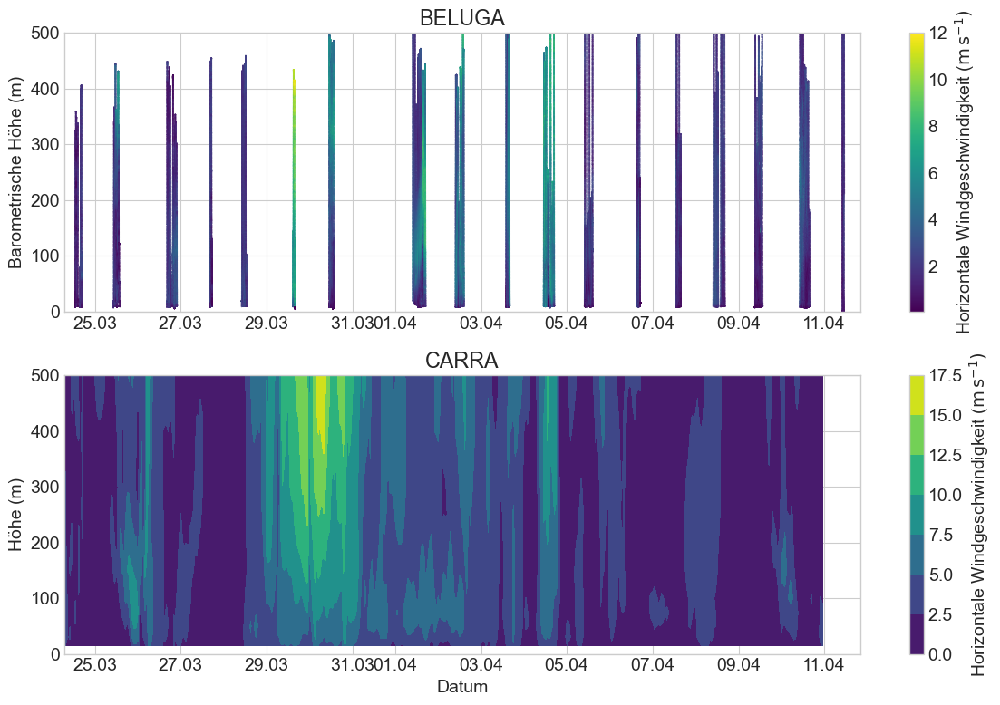

In [ ]:
ds_beluga = open_all_beluga_TMP_flights()
ds_radio = open_all_radiosonde()
ds_radio['ws']=np.sqrt(ds_radio['u']**2+ds_radio['v']**2)

fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)
carra_plot = ds_carra.sel(valid_time=slice('2024-03-24', '2024-04-15'))
s2 = ax2.contourf(carra_plot['valid_time'],carra_plot['heightAboveGround'],carra_plot['ws'].T,cmap='viridis')
s3 = ax1.scatter(ds_beluga['time'], ds_beluga['z_b'], c=ds_beluga['vv'], cmap='viridis', s=0.05)
c2 = plt.colorbar(s2, label='Horizontale Windgeschwindigkeit ($\mathrm{m\,s^{-1}})$')
c3 = plt.colorbar(s3, label='Horizontale Windgeschwindigkeit ($\mathrm{m\,s^{-1}})$')
ax1.set_ylim(0,500)
ax2.set_ylim(0,500)
ax2.xaxis.set_major_formatter(mdates.DateFormatter("%d.%m"))
ax1.xaxis.set_major_formatter(mdates.DateFormatter("%d.%m"))
ax1.set_xlim(ds_beluga.time.min()-pd.Timedelta('6h'), ds_beluga.time.max()+pd.Timedelta('6h'))
ax2.set_xlim(ds_beluga.time.min()-pd.Timedelta('6h'), ds_beluga.time.max()+pd.Timedelta('6h'))
ax2.set_ylabel('Höhe (m)')
ax1.set_ylabel('Barometrische Höhe (m)')
ax2.set_xlabel('Datum')
ax1.set_title('BELUGA')
ax2.set_title('CARRA')
#ax1.tick_params(axis='x', labelbottom=False)
plt.tight_layout()

#plt.savefig(r'C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\uebersicht.png', bbox_inches='tight')


<>:45: SyntaxWarning: invalid escape sequence '\,'
<>:48: SyntaxWarning: invalid escape sequence '\,'
<>:52: SyntaxWarning: invalid escape sequence '\,'
<>:57: SyntaxWarning: invalid escape sequence '\,'
<>:61: SyntaxWarning: invalid escape sequence '\m'
<>:45: SyntaxWarning: invalid escape sequence '\,'
<>:48: SyntaxWarning: invalid escape sequence '\,'
<>:52: SyntaxWarning: invalid escape sequence '\,'
<>:57: SyntaxWarning: invalid escape sequence '\,'
<>:61: SyntaxWarning: invalid escape sequence '\m'
C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\42111682.py:45: SyntaxWarning: invalid escape sequence '\,'
  ax1.errorbar(mean_profile['dir'],mean_profile['z_bin'],xerr=mean_profile_std['dir'],fmt='o',markersize=3,capsize=2,alpha=0.7,label='BELUGA (10$\,$m mean)')
C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\42111682.py:48: SyntaxWarning: invalid escape sequence '\,'
  ax1.errorbar(df_rs_mean['mean_dir'],df_rs_mean['altitude'], xerr=df_rs_mean['mean_dir_std'],fmt='o',markersize

saved


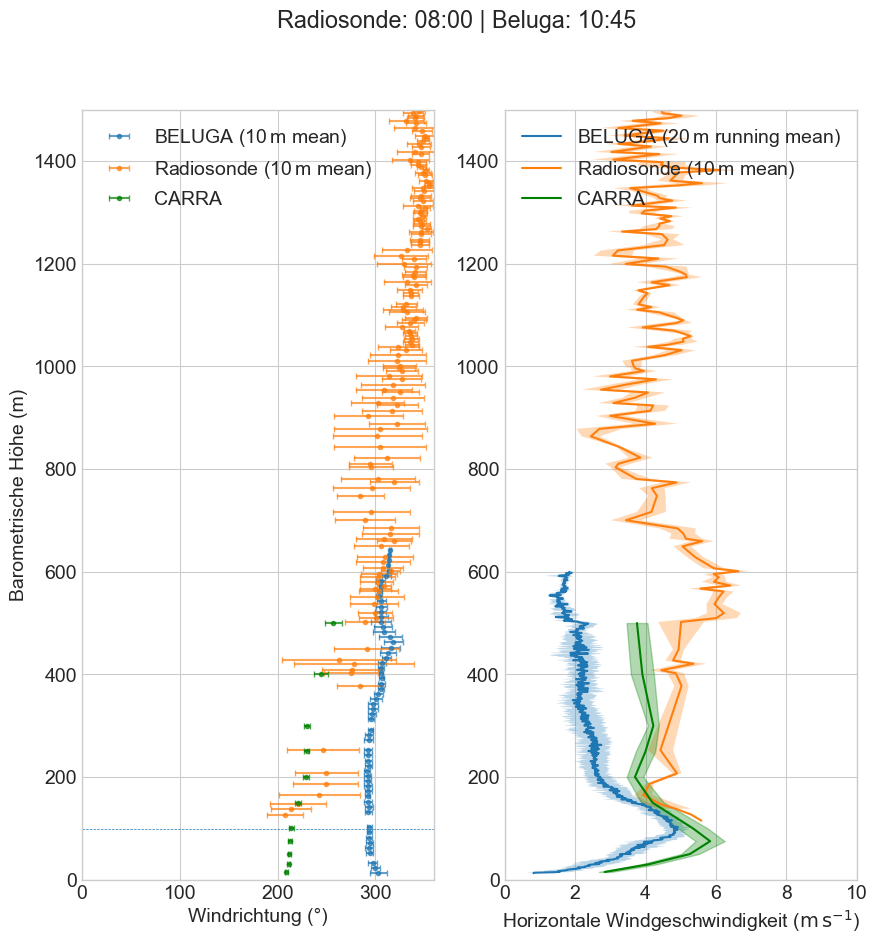

In [ ]:

def rs_v_dir_llj(flight=''):

    fig = plt.figure(figsize=(10,10)) 
    ax1 = fig.add_subplot(1,2,1)
    ax2 = fig.add_subplot(1,2,2)

    df,deltav, deltaz = flight_segment_analysis(flight=flight)
    vdir_list = [] #list for calculated wind direction
    df_rs = open_radiosonde_data(flight=flight)
    df_rs_mean = radiosonde_mean_dir(flight=flight)
    ds= open_beluga_TMP_flight(flight=flight)

    for seg in df['segment']:
        if flight == 'RF06': 
            ds_seg=ds
        else:
            ds_seg = ds.where(ds['flight_segments'] == seg, drop=True)

        for z, d, v in zip(ds_seg['z_b'].values, ds_seg['dd'].values, ds_seg['vv'].values):
            vdir_list.append({
                'z_b': float(z),
                'dir': float(d),
                'vv': float(v)
            })

    vdir_df = pd.DataFrame(vdir_list)

    dz = 10 
    #mean of beluga wind direction over all llj profiles
    z_grid_beluga = np.arange(ds['z_b'].min(), ds['z_b'].max()+dz, dz) 
    vdir_df['z_bin']=pd.cut(vdir_df['z_b'], bins=z_grid_beluga, labels=z_grid_beluga[:-1])
    mean_profile=(vdir_df.groupby('z_bin')['dir'].apply(lambda x: circmean(x, high=360, low=0)).reset_index())
    mean_profile_std =(vdir_df.groupby('z_bin')['dir'].apply(lambda x: circstd(x, high=360, low=0)).reset_index())

    

    dz=1
    #running mean beluga wind speed
    ds, llj_height = mean_ws_llj(flight=flight)
    mean_v = ds['vv']
    mean_v_std = ds['vv_std']
    
    #plot beluga wind dir 
    ax1.set_xlim(0,360)
    ax1.errorbar(mean_profile['dir'],mean_profile['z_bin'],xerr=mean_profile_std['dir'],fmt='o',markersize=3,capsize=2,alpha=0.7,label='BELUGA (10$\,$m mean)')
   
    #plot radiosonde wind dir 
    ax1.errorbar(df_rs_mean['mean_dir'],df_rs_mean['altitude'], xerr=df_rs_mean['mean_dir_std'],fmt='o',markersize=3,capsize=2, alpha=0.7,label='Radiosonde (10$\,$m mean)')
    ax1.set_ylim(0,1500)

    #plot beluga wind speed 
    ax2.plot(mean_v, ds['z'], label='BELUGA (20$\,$m running mean)')
    ax2.fill_betweenx(ds['z'], mean_v+mean_v_std,  mean_v-mean_v_std, alpha=0.3)
    ax1.hlines(llj_height, xmin=0, xmax=360, linestyles='dashed', linewidth=0.5)

    #plot radiosonde wind speed 
    ax2.plot(df_rs_mean['u_mean_rolling'], df_rs_mean['altitude'], label='Radiosonde (10$\,$m mean)')
    ax2.fill_betweenx(df_rs_mean['altitude'], df_rs_mean['u_mean_rolling']+df_rs_mean['u_mean_rolling_std'],df_rs_mean['u_mean_rolling']-df_rs_mean['u_mean_rolling_std'], alpha=0.3 )
    ax1.set_xlabel('Windrichtung (°)')
    ax1.set_ylabel('Barometrische Höhe (m)')
    ax2.set_xlabel('Horizontale Windgeschwindigkeit ($\mathrm{m\,s^{-1}}$)')

    ax2.set_xlim(0,10)
    ax2.set_ylim(0,1500)

    #read carra data 
    df_carra = get_carra(flight=flight)
    z_carra = df_carra[df_carra.columns[0]]
    dir_carra = df_carra['wdir']
    std_dir=df_carra['wdir_std']
    std_ws = df_carra['ws_std']
    ws_carra = df_carra['ws']

    #plot carra wind dir 
    ax1.errorbar( dir_carra,z_carra,xerr=std_dir, fmt='o', markersize=3,capsize=2, color='green', alpha=0.7, label='CARRA')
    #plot carra wind speed
    ax2.plot(ws_carra, z_carra, label='CARRA', color='green') #carra keine running means da zu wenig datenpunkte, nur means über höhengruppierung
    ax2.fill_betweenx(z_carra, ws_carra-std_ws, ws_carra+std_ws, color='green', alpha=0.3 )

    ds_bel = open_beluga_TMP_flight(flight=flight)
    time_rs = df_rs.time.mean().dt.strftime("%H:%M").item()
    time_beluga = ds_bel.time.mean().dt.strftime("%H:%M").item()
    
    fig.suptitle(f"Radiosonde: {time_rs} | Beluga: {time_beluga}")
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper left')
    #fig.savefig(r'C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\rs_beluga_ws_dir\rs_beluga_flight_'+flight, bbox_inches='tight')
    print('saved')

# for i, n in enumerate(llj_list):
#     rs_v_dir_llj(flight='RF'+f'{n:02d}')


rs_v_dir_llj(flight='RF12')


#beluga raus 


C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\2445155344.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_profile=(vdir_df.groupby('z_bin')['dir'].apply(lambda x: circmean(x, high=360, low=0)).reset_index())
C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\2445155344.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_profile_std =(vdir_df.groupby('z_bin')['dir'].apply(lambda x: circstd(x, high=360, low=0)).reset_index())


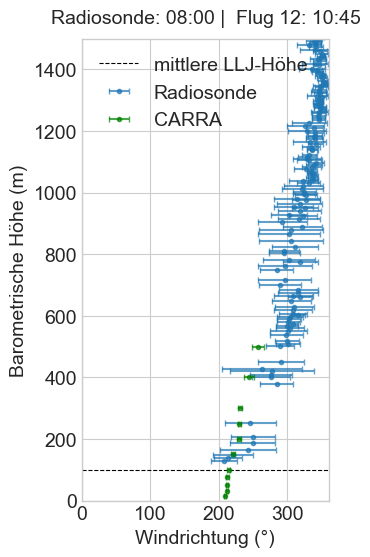

In [ ]:
def rs_v_dir_llj_ws(flight='', subplot=1):
    ax1 = fig.add_subplot(1,2,subplot)
    df,deltav, deltaz = flight_segment_analysis(flight=flight)
    vdir_list = [] #list for calculated wind direction
    df_rs = open_radiosonde_data(flight=flight)
    df_rs_mean = radiosonde_mean_dir(flight=flight)
    ds= open_beluga_TMP_flight(flight=flight)

    for seg in df['segment']:
        if flight == 'RF06': 
            ds_seg=ds
        else:
            ds_seg = ds.where(ds['flight_segments'] == seg, drop=True)

        for z, d, v in zip(ds_seg['z_b'].values, ds_seg['dd'].values, ds_seg['vv'].values):
            vdir_list.append({
                'z_b': float(z),
                'dir': float(d),
                'vv': float(v)
            })

    vdir_df = pd.DataFrame(vdir_list)

    dz = 10 
    #mean of beluga wind direction over all llj profiles
    z_grid_beluga = np.arange(ds['z_b'].min(), ds['z_b'].max()+dz, dz) 
    vdir_df['z_bin']=pd.cut(vdir_df['z_b'], bins=z_grid_beluga, labels=z_grid_beluga[:-1])
    mean_profile=(vdir_df.groupby('z_bin')['dir'].apply(lambda x: circmean(x, high=360, low=0)).reset_index())
    mean_profile_std =(vdir_df.groupby('z_bin')['dir'].apply(lambda x: circstd(x, high=360, low=0)).reset_index())


    dz=1
    #running mean beluga wind speed
    ds, llj_height = mean_ws_llj(flight=flight)
    mean_v = ds['vv']
    mean_v_std = ds['vv_std']
    
    #plot beluga wind dir 
    ax1.set_xlim(0,360)
    #ax1.errorbar(mean_profile['dir'],mean_profile['z_bin'],xerr=mean_profile_std['dir'],fmt='o',markersize=3,capsize=2,alpha=0.7,label='BELUGA')
   
    #plot radiosonde wind dir 
    ax1.errorbar(df_rs_mean['mean_dir'],df_rs_mean['altitude'], xerr=df_rs_mean['mean_dir_std'],fmt='o',markersize=3,capsize=2, alpha=0.7,label='Radiosonde')
    ax1.set_ylim(0,1500)

    #plot beluga wind speed 
    ax1.hlines(llj_height, xmin=0, xmax=360, linestyles='dashed', linewidth=0.8, label='mittlere LLJ-Höhe', color='black')

    #plot radiosonde wind speed 

    ax1.set_xlabel('Windrichtung (°)')

    if subplot ==1:
        ax1.set_ylabel('Barometrische Höhe (m)')


    #read carra data 
    df_carra = get_carra(flight=flight)
    z_carra = df_carra[df_carra.columns[0]]
    dir_carra = df_carra['wdir']
    std_dir=df_carra['wdir_std']
    std_ws = df_carra['ws_std']
    ws_carra = df_carra['ws']

    #plot carra wind dir 
    ax1.errorbar( dir_carra,z_carra,xerr=std_dir, fmt='o', markersize=3,capsize=2, color='green', alpha=0.7, label='CARRA')
    ds_bel = open_beluga_TMP_flight(flight=flight)
    time_rs = df_rs.time.mean().dt.strftime("%H:%M").item()
    time_beluga = ds_bel.time.mean().dt.strftime("%H:%M").item()
    
    ax1.text(-45, 1550, f"Radiosonde: {time_rs} |  Flug {flight[2:]}: {time_beluga}")
    ax1.legend(loc='upper left')
    return ax1 


fig = plt.figure(figsize=(7,6))
ax1 = rs_v_dir_llj_ws(flight='RF12', subplot=1)
#ax2 = rs_v_dir_llj_ws(flight='RF19', subplot=2)
fig.savefig(r"C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\rs_beluga_ws_dir\dir_12.png", bbox_inches='tight')




In [ ]:
def ekman_plot(flight='RF12', dz=5):

    ds = open_beluga_TMP_flight(flight=flight)
    ds = ds.assign_coords(z_bin=(("time"), np.round(ds['z_b'].values/dz)*dz))
    ds_mean = ds.groupby('z_bin').mean()
    ds_mean = ds_mean.where(ds_mean['z_bin'] <= 500, drop=True)

    u = ds_mean["u_lon"].values
    v = ds_mean["u_lat"].values
    z = ds_mean["z_bin"].values

    fig, ax = plt.subplots(figsize=(8,8))

    q = ax.quiver(np.zeros_like(u), np.zeros_like(v), u, v, z, cmap="viridis", angles="xy", scale_units="xy", scale=1)

    # nur für Autoscaling
    ax.scatter(u, v, alpha=0)

    plt.colorbar(q, ax=ax, label="Höhe (m)")
    plt.xlabel('u$~(\mathrm{m\,s^{-1}}$)')
    plt.ylabel('v$~(\mathrm{m\,s^{-1}}$)')
    #plt.savefig(r'C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\ekman\ekman_flight_'+flight, bbox_inches='tight')

# for i, n in enumerate(llj_list):
#     ekman_plot(flight='RF'+f'{n:02d}')

<>:20: SyntaxWarning: invalid escape sequence '\m'
<>:21: SyntaxWarning: invalid escape sequence '\m'
<>:20: SyntaxWarning: invalid escape sequence '\m'
<>:21: SyntaxWarning: invalid escape sequence '\m'
C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\10699900.py:20: SyntaxWarning: invalid escape sequence '\m'
  plt.xlabel('u$~(\mathrm{m\,s^{-1}}$)')
C:\Users\mauri\AppData\Local\Temp\ipykernel_17920\10699900.py:21: SyntaxWarning: invalid escape sequence '\m'
  plt.ylabel('v$~(\mathrm{m\,s^{-1}}$)')


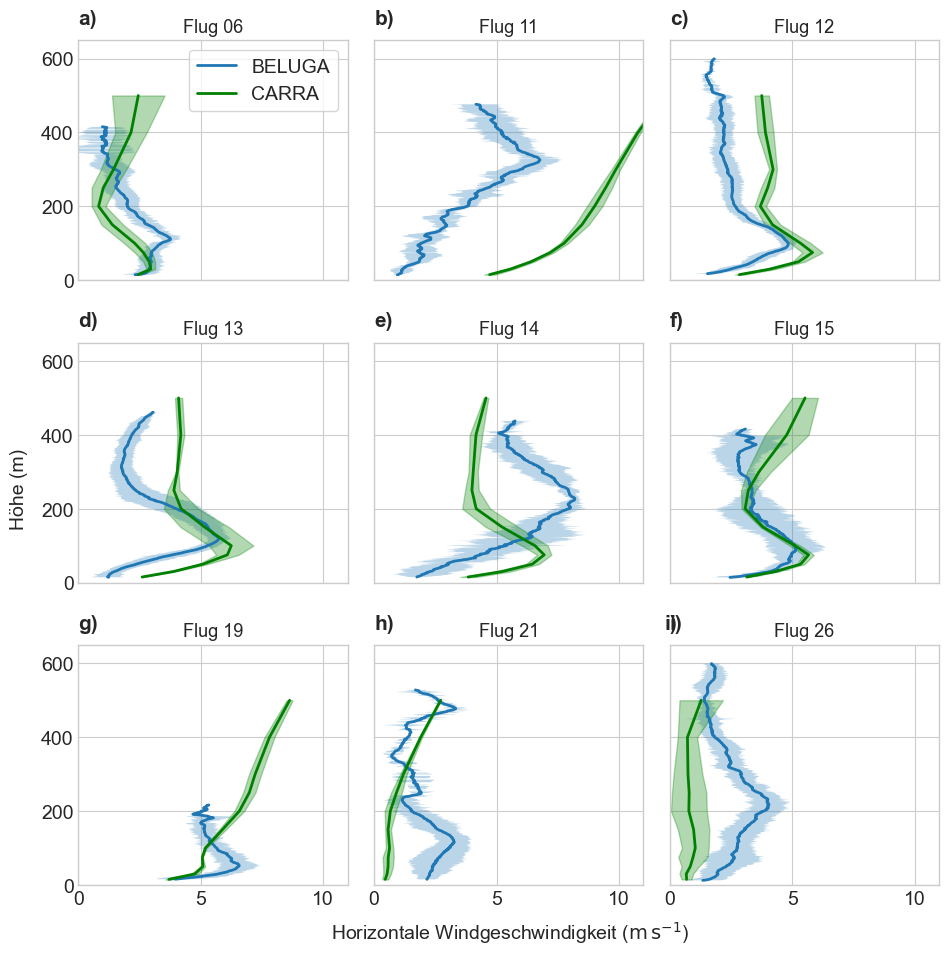

In [ ]:
#3x3 carra_llJ 

fig, axes = plt.subplots( 3, 3, figsize=(10, 10), sharex=True, sharey=True)

axes = axes.flatten()

for i, flight in enumerate(llj_list):
    letter = chr(97 + i)
    ax = axes[i]
    ax.set_xlim(0,11)
    ax.set_ylim(0,650)

    # BELUGA mean profile
    df_llj, llj_height = mean_ws_llj(flight=f'RF{flight:02d}')

    # CARRA mean profile
    df_carra = get_carra(flight=f'RF{flight:02d}')

    # BELUGA
    ax.plot( df_llj['vv_rmean'], df_llj['z'], label='BELUGA', linewidth=2)
    ax.fill_betweenx( df_llj['z'], df_llj['vv_rmean']-df_llj['vv_std'], df_llj['vv_rmean']+df_llj['vv_std'], alpha=0.3)

    # CARRA
    ax.plot( df_carra['ws'], df_carra[df_carra.columns[0]], label='CARRA', linewidth=2, color='green')
    ax.fill_betweenx(df_carra[df_carra.columns[0]], df_carra['ws'] - df_carra['ws_std'], df_carra['ws'] + df_carra['ws_std'], alpha=0.3, color='green')

    if flight ==6:
        ax.set_title(f'Flug 06', fontsize=13)
        ax.text(0, 1.05, f'{letter})', transform=ax.transAxes, ha='left', va='bottom',  fontsize=15, fontweight='bold' )
    else:
        ax.set_title(f'Flug {flight}', fontsize=13)
        ax.text(0, 1.05, f'{letter})', transform=ax.transAxes, ha='left', va='bottom', fontsize=15, fontweight='bold')

    ax.grid(True)

    if i % 3 != 0:
        ax.tick_params( axis='y', labelleft=False)
        ax.set_ylabel('')

    if i < 6:
        ax.tick_params( axis='x', labelbottom=False)
        ax.set_xlabel('')


#achsenbeschriftung
fig.text( 0.55, 0.05, r'Horizontale Windgeschwindigkeit ($\mathrm{m\,s^{-1}}$)', ha='center', fontsize=14)

fig.text( 0.05, 0.5, 'Höhe (m)', va='center', rotation='vertical', fontsize=14)
fig.text(-0.02, 1.05, f'{letter})', transform=ax.transAxes, ha='left' ,va='bottom', fontsize=15, fontweight='bold')
#legende nur einmal
axes[0].legend(loc='best',frameon=True,facecolor='white')
plt.tight_layout(rect=[0.06, 0.06, 1, 1])
plt.savefig(r"C:\Users\mauri\Documents\Bachelor\Bachelorarbeit\script\plots\llj_carra.png", bbox_inches='tight')

plt.show()